# APLICACIÓN KMEANS EN LOS 24 TÓPICOS ENCONTRADOS POR LDA

**Contenido**

Análisis de tópicos del 0 al 23 en orden ascendente.

El objetivo de este notebook es la implementación del algoritmo Kmeans a los tópicos encontrados en el tercer notebook, con el fin de extraer patrones de comportamiento. 


<div class="alert alert-info" style="margin: 20px">
Se decide crear este algoritmo con el fin de obtener mayor grado de detales en las OT de las base de datos. En otras palabras, se busca identificar clusters específicos, conservando el sentido semantico de la oración, a diferencia del anterior estructura LDA que nos permitió tener una visión general. </div>

# I. DISEÑO DEL ALGORITMO

#### Importar paquetes

In [1]:
import collections
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from pprint import pprint
import numpy as np
from string import punctuation
from time import time
import os
import pandas as pd
from IPython.display import Image
import matplotlib.pyplot as plt

# Stop Words
with open('../spanish4.0.txt','r') as f:
    stop_words = f.read().splitlines()

#### Estructura del algoritmo

In [2]:
# Tokenizar palabras
def word_tokenizer(text):    
    tokens = word_tokenize(text)   # tokenizes and stems the text
    # non_words = list(punctuation)  # removes punctuation 
    # text = ''.join([c for c in text if c not in non_words]) ---> Data ingresada ya está libre de puntuación
    stemmer = SnowballStemmer('spanish')
    tokens = [stemmer.stem(t) for t in tokens if t not in stop_words] # Posibilidad de extender stopwords
    return tokens

# Número óptimo de clústers
def elbow_method(sentences,figsize = (8,5),  namecol=None, nro_top=None, save = False,width_text = 0.83, height_text = 0.92):
    tfidf_vectorizer = TfidfVectorizer(tokenizer=word_tokenizer,stop_words=stop_words,lowercase=True)
    tfidf_matrix = tfidf_vectorizer.fit_transform(sentences)   #builds a tf-idf matrix for the sentences
    import warnings
    
    try:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            if len(sentences)<= 30:
                list_k = list(range(1,len(sentences)+1))
                elbow = []
                for i in list_k:
                    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 101)
                    kmeans.fit(tfidf_matrix)
                    elbow.append(kmeans.inertia_)

            elif len(sentences)> 30 and len(sentences)<= 70:
                list_k = list(range(2,len(sentences)+1,2))
                elbow = []
                for i in list_k:
                    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 101)
                    kmeans.fit(tfidf_matrix)
                    elbow.append(kmeans.inertia_)     

            else:     
                list_k = list(range(2,71,4))
                elbow = []
                for i in list_k:
                    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 101)
                    kmeans.fit(tfidf_matrix)
                    elbow.append(kmeans.inertia_)

            from kneed import KneeLocator
            kn = KneeLocator(list_k, elbow, curve='convex', direction='decreasing')
            print(f'Número óptimo de clústers: {kn.knee}')

            plt.rcParams.update({'figure.figsize':figsize})
            plt.xlabel('Número de clusters k')
            plt.ylabel('Suma de distancias cuadradas')
            plt.plot(list_k, elbow, 'bo-')
            plt.title('Método del Elbow')
            plt.text(width_text, height_text, f'k óptimo: {kn.knee}', transform=plt.gca().transAxes)
            plt.vlines(kn.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')
            if save :
                plt.savefig(f'{namecol} {nro_top} - Método del elbow.jpg', dpi= 200, quality=95)
            plt.show()

    except ValueError:
        print('You must enter at least two sentences')
        
# Algoritmo Kmeans
def cluster_sentences(sentences, nb_of_clusters):
    
    tfidf_vectorizer = TfidfVectorizer(tokenizer=word_tokenizer,stop_words=stop_words,lowercase=True)
    tfidf_matrix = tfidf_vectorizer.fit_transform(sentences)   #builds a tf-idf matrix for the sentences
    
    kmeans = KMeans(n_clusters=nb_of_clusters,max_iter=300)
    #kmeans.fit(tfidf_matrix)
    X_dist=kmeans.fit_transform(tfidf_matrix)**2  #Se calcula la distancia del cluster y se multiplica al cuadrado
    clusters = collections.defaultdict(list)
    for i, label in enumerate(kmeans.labels_):
        clusters[label].append(i)

    Distancia=X_dist.sum(axis=1)  #Se calcula la distancia por columna de la matriz

    distDict={}  #Se traspasa a un diccionario con las distancias por cluster
    for key,val in clusters.items():
        distDict[key]=Distancia[val]

    representativos=[]   # Se guarda en una lista los valores mínimos de cada cluster (Menor distancia al centro mejor es el representativo)
    
    #Verificacion de los numeros de clusters
    #Si se intenta obtener los representativos de un número mas grande de cluster que el permitido, se procesa el número de clusters
    if len(distDict)<nb_of_clusters:
        nb_of_clusters=len(distDict)
        
    #Verificacion de los números de clústers
    for i in range(nb_of_clusters):
        representativos.append(np.where(distDict[i]==min(distDict[i]))[0][0])

    return dict(clusters),representativos

# Plot cantidad de sentences por cluster
def len_clusters(dic, n, namecol=None, nro_top=None, save = False, width = 0.6, color = "royalblue", figsize = (8,5)):
    keys = list(range(0,n))
    len_values = [len(dic[i]) for i in keys]
    plt.rcParams.update({'figure.figsize': figsize})
    plt.bar(keys,len_values , align='center', color = color, width = width)
    plt.title('Cantidad de OT por clúster')
    plt.xlabel('Clusters')
    plt.ylabel('Orden de Trabajo (OT)')
    plt.xticks(np.arange(min(keys), max(keys)+1, 1.0))
    if save:
        plt.savefig(f'{namecol} {nro_top} - Distribucion clusters .jpg', dpi= 200, quality=95)
    plt.show()

<div class="alert alert-success" style="margin: 20px">En todos los data frames ya está implementada la función word_cleaner() que permitió limpiar la base de datos. Para más información de esta función ir al segundo notebook.</div>


# II. RESULTADOS DE KMEANS - OBSERVACIONES

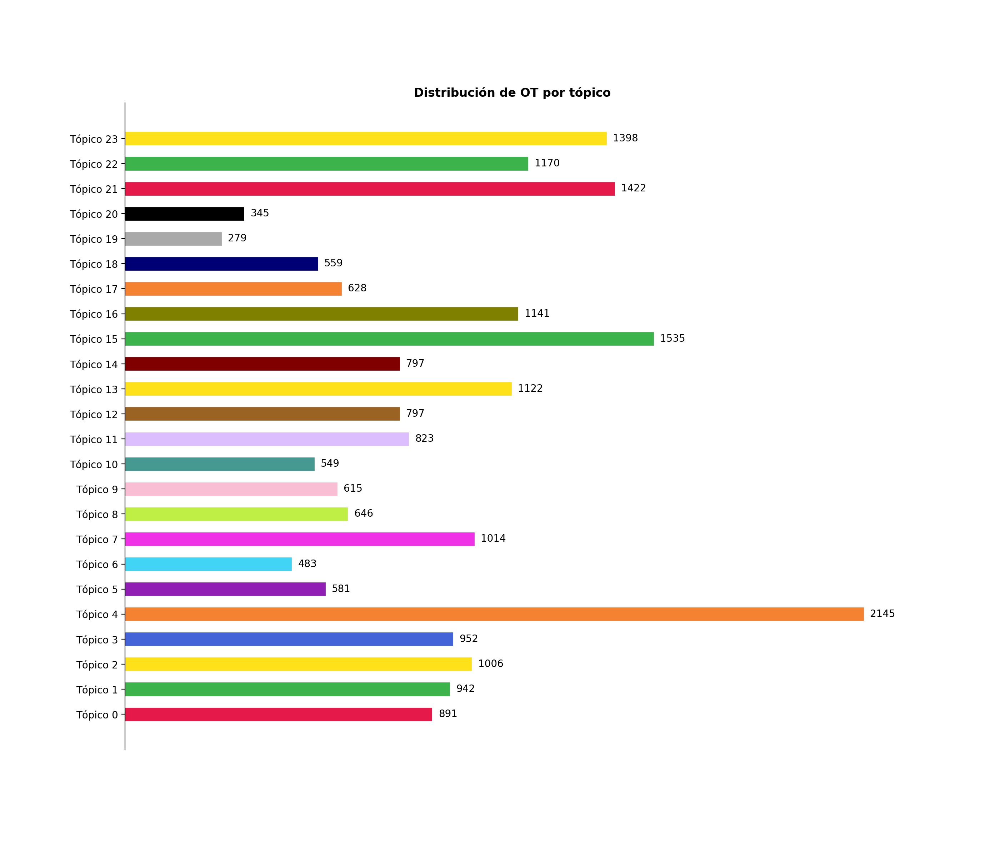

In [8]:
from IPython.display import Image
Image(filename='../2. Topic Modeling - LDA 24 topics/Topic distribution - barplot.jpg', width=1000, height=600)

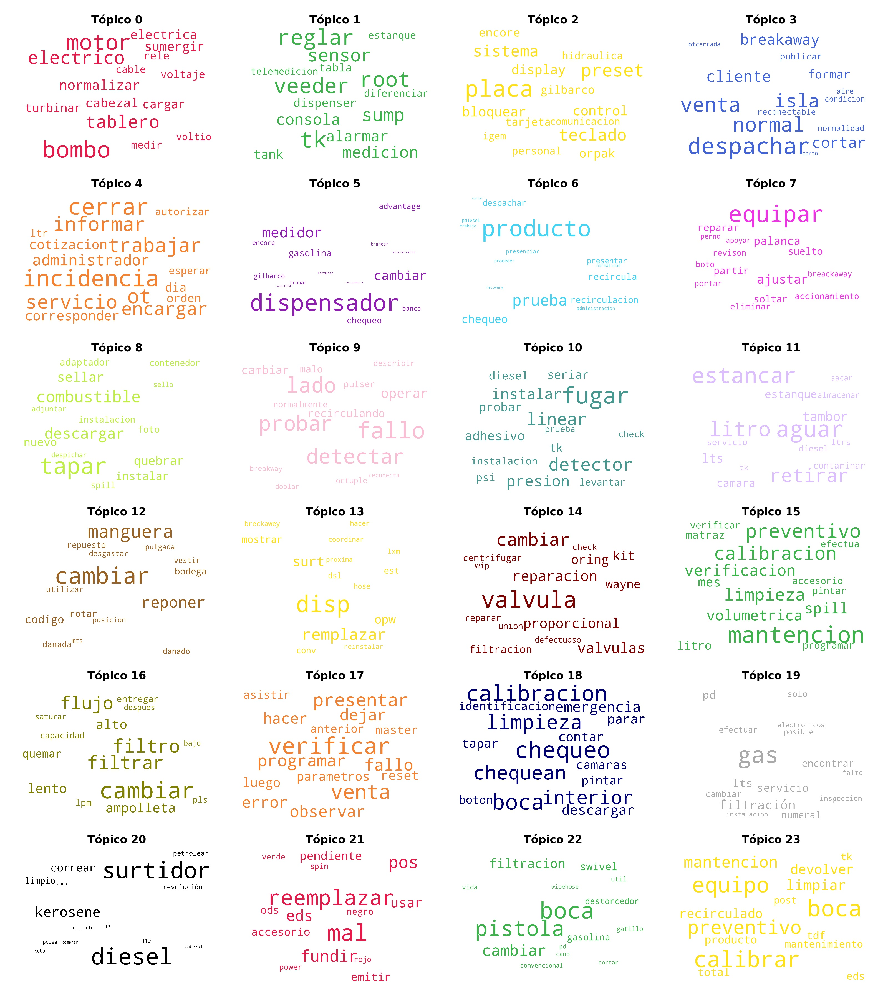

In [9]:
Image(filename='../2. Topic Modeling - LDA 24 topics/word cloud.jpg', width=1000, height=800)

In [10]:
# Importar Data Frame
# Se trabaja con el data frame que contiene registros en formato de sentences ([sent1,sent2,...,sentn])
df = pd.read_pickle('../2. Topic Modeling - LDA 24 topics/BD_original_cleaned_TOPICO_DOMINANTE.pkl')
df.head()

,Region,Estacion,Tipo de Falla,Prioridad Cliente,Estado OT,Tecnico Asignado,Dia,Nro Dia,Mes,Hora,Rango Recep/Arribo,Rango Arribo/Cierre,Observación,Requerimiento,Topico Dominante
0,13°,Tingaro Spa.,Carrete RetractilOTROOTRO,Normal 48 Horas,CERRADA,Juan Aliaga,Viernes,30,AGO 19,16,Error en fechas,Más de 1 mes,se cambia placa de tk 2 gas95 por placa que in...,area de atencion habilitar estanque de combust...,2
1,8°,Combustibles El Volcan Ltda.,Carrete RetractilOTROOTRO,Normal (48 hrs),CERRADA,On Line,Viernes,30,AGO 19,12,Error en fechas,Menos de 1h,cambio de graficas de equipos no esta contempl...,area de atencion combustible maria veronica go...,23
2,10°,LLANOS Y WAMMES SOCIEDAD COMERCIAL LTDA.,Carrete RetractilOTROOTRO,Normal 24 Horas,PRECIERRE,Luis Almonacid,Viernes,30,AGO 19,12,0 a 24 horas,Menos de 1h,se visita eds para chequeo de dispensador el c...,area de atencion surtidor de diesel a ratos co...,3
3,1°,Soc. Imp. y Exp. Nuevo Amanecer Ltda. (SOCIEX),Carrete RetractilOTROOTRO,Normal (48 hrs),CERRADA,On Line,Viernes,30,AGO 19,12,0 a 24 horas,Menos de 1h,remplazo de graficas no esta contemplado en es...,area de atencion combustible cambiar graficas ...,4
4,3°,Inmobiliaria e Inversiones San José Ltda (Vall...,Carrete RetractilOTROOTRO,Normal (48 hrs),CERRADA,On Line,Viernes,30,AGO 19,12,Error en fechas,Menos de 1h,remplazo de graficas no esta contemplado en co...,area de atencion combustible solicita grafica ...,4


In [11]:
type(df['Topico Dominante'][0])

numpy.int32

### 1. Tópico 0

In [12]:
# Cantidad de OT
namecol = 'Topico'
save = True
df_topic = df[df['Topico Dominante'] == 0] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

891

Número óptimo de clústers: 34


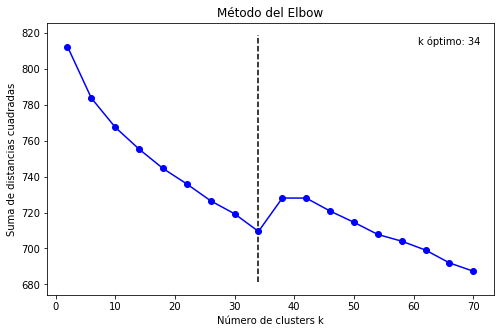

Wall time: 26.4 s


In [13]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=0, save=save)

In [14]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters=34
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se realiza revision de disp 78 por solicitud de administradora por haber sentido olor a quemado desde dispensador se revisa electronica y caja de conexiones electricas no se encuentra nada quemado y esta todo operativo se realizan pruebas con ventas queda operativo se realiza revision de disp 78 por solicitud de administradora por haber sentido olor a quemado desde dispensador se revisa electronica y caja de conexiones electricas no se encuentra nada quemado y esta todo operativo se realizan pruebas con ventas queda operativo
	sentence  0 :  se realiza revision de disp 78 por solicitud de administradora por haber sentido olor a quemado desde dispensador se revisa electronica y caja de conexiones electricas no se encuentra nada quemado y esta todo operativo se realizan pruebas con ventas queda operativo se realiza revision de disp 78 por solicitud de administradora por haber sentido olor a quemado desde dispensador se revisa electronica y caja de conexiones electr

	sentence  21 :  se realiza cambio de turbina quedando ok
	sentence  22 :  es reemplazado 01 contactor en tablero electrico sistema control de turbina por estar en mal estado equipo queda operativo es reemplazado 01 contactor en tablero electrico sistema control de turbina por estar en mal estado equipo queda operativo
	sentence  23 :  se reemplaza 1 turbina 15 hp trifasica en estanque gas 95 se presta apoyo a macec atendido por luis vargas y gabriel acuna
	sentence  24 :  se detecta turbina quemada del sector dispensadores lo cual se cambia quedando operativo
	sentence  25 :  se realiza revision se encuentra turbina en mal estado se procede al cambio de turbina se realizan pruebas quedando operativo
	sentence  26 :  se realiza a revisar la bomba de 97 se revisa el consumo y detecta turbina en mal estado se solicita repuesto para su cambio se realiza cambio de 1 turbina en producto 97 se realiza prueba en lado 4 se sacan 18litros para pruebas equipo operativo
	sentence  27 :  queda pen

In [15]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se realiza revision de disp 78 por solicitud de administradora por haber sentido olor a quemado desde dispensador se revisa electronica y caja de conexiones electricas no se encuentra nada quemado y esta todo operativo se realizan pruebas con ventas queda operativo se realiza revision de disp 78 por solicitud de administradora por haber sentido olor a quemado desde dispensador se revisa electronica y caja de conexiones electricas no se encuentra nada quemado y esta todo operativo se realizan pruebas con ventas queda operativo
Cluster  1 : se visita eds a estacion se solicita motor 34 para su reemplazo se cambia 1 motor monofasico 220 volts 34 hp y 1 correa motor ajustable producto 97 lados 12 quedando surtidor operativo y despachando producto 97 95 se chequea con venta quedando operativo se visita eds a estacion se solicita motor 34 para su reemplazo se cambia 1 motor monofasico 220 volts 34 hp y 1 correa motor ajustable producto 97 lados 12 quedando surtidor operativo y d

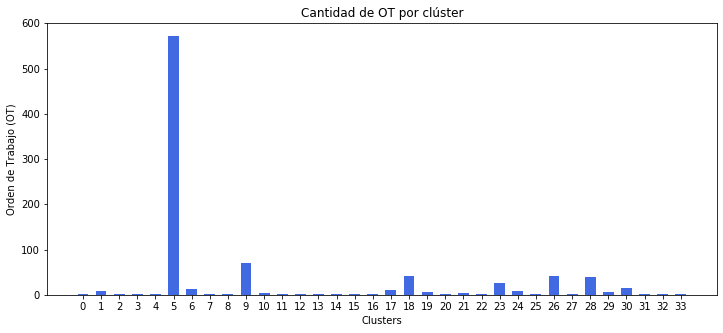

In [17]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=0, width = 0.6, save = False, figsize = (12,5)) 

### 2. Tópico 1

In [18]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 1] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

942

Número óptimo de clústers: 18


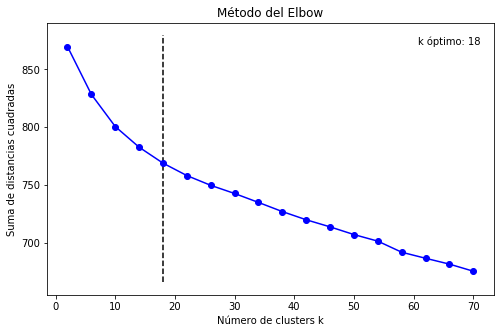

Wall time: 28.9 s


In [19]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=1, save = save)

In [20]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 18
clusters,representativos = cluster_sentences(sentences,nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : veeder root con alarma q2 se sacaron y reinstalaron sensores de presion para intercambiar gas 93 x 97 se detecta falla en cableado de senal del dflp gas 93 en consola veeder root se deja provisoriamente puenteado cto de control se realiza limpieza interior de sump est 93 disp 2 d bloqueado por codigo de error se saco y reintalo pulser para chequeo y limpieza se despeja falla quedo disp funcionando ok se informa a petrobras de falla en v r para la reparacion de este se deriva a trabajo adicional para cotizar cableado desde veeder root hasta estanque se realiza revision de cableado de sensores al revisar caja de desviacion de la telemedicion tk n2 gas 93 nos encontramos que tenia la caneria rota por lo que deberia ser reparada para que no se llene de agua
	sentence  0 :  se realiza el cambio de 1 transformador 220v en veeder root por estar malo quedando operativo se ajusta contactor de ppu en disp 1 dsl por estar suelto quedando operativo
	sentence  1 :  se realiza

	sentence  42 :  se realiza a medir con regla en descarga directa de kerosen no esta arrojando nada de agua con la regla luego se saca la probeta y se introduce la regla y tampoco arroja agua se limpia los flotadores se espera un rato se conecta la probeta se introduce y veeder root todavia perciste la alarma de agua se require revisar con gilbarco el veeder root y la sonda telemedicion de kerosen se realiza a medir con regla en descarga directa de kerosen no esta arrojando nada de agua con la regla luego se saca la probeta y se introduce la regla y tampoco arroja agua se limpia los flotadores se espera un rato se conecta la probeta se introduce y veeder root todavia perciste la alarma de agua se require revisar con gilbarco el veeder root y la sonda telemedicion de kerosen
	sentence  43 :  se requieren tablas de calibracion para corregir error de telemedicion se indican que estanques diesel y 93 presentan variaciones negativas se toman datos de ventas desde inicio de mes producto dies

In [21]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : veeder root con alarma q2 se sacaron y reinstalaron sensores de presion para intercambiar gas 93 x 97 se detecta falla en cableado de senal del dflp gas 93 en consola veeder root se deja provisoriamente puenteado cto de control se realiza limpieza interior de sump est 93 disp 2 d bloqueado por codigo de error se saco y reintalo pulser para chequeo y limpieza se despeja falla quedo disp funcionando ok se informa a petrobras de falla en v r para la reparacion de este se deriva a trabajo adicional para cotizar cableado desde veeder root hasta estanque se realiza revision de cableado de sensores al revisar caja de desviacion de la telemedicion tk n2 gas 93 nos encontramos que tenia la caneria rota por lo que deberia ser reparada para que no se llene de agua
Cluster  1 : se realiza confeccion e instalacion de 2 reglas en tk 93 y diesel
Cluster  2 : indican tener diferencias entre las reglas de medicion y veeder root en todos los estanques los estanques se encuentran en 1pts en 

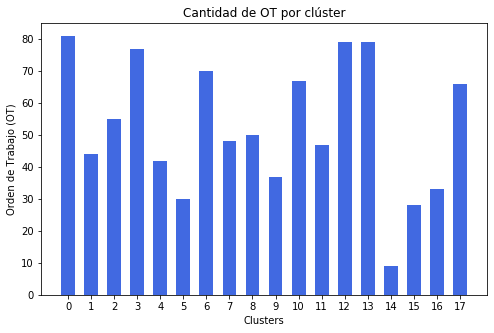

In [22]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=1, width = 0.6, save=save)

### 3. Tópico 2

In [23]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 2] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

1006

Número óptimo de clústers: 26


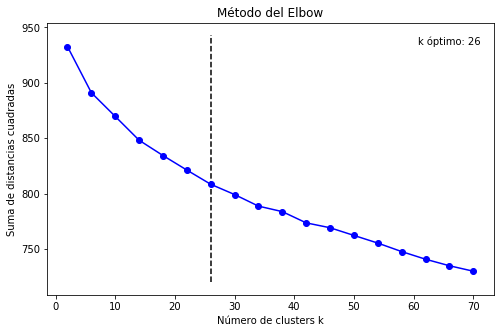

Wall time: 34 s


In [24]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=2, save=save)

In [25]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 26
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se realiza cambio de 1 teclado de programacion encore a equipo surtidor se realizan pruebas quedando operativo se realiza cambio de 1 teclado de programacion encore a equipo surtidor se realizan pruebas quedando operativo
	sentence  0 :  se chequea falla detectando problema en desconfiguracion de parametros se realiza cambios en programacion quedando operativo se chequea falla detectando problema en desconfiguracion de parametros se realiza cambios en programacion quedando operativo
	sentence  1 :  se realiza el cambio de un teclado programacion en el dispensador 3 quedando ok se realiza el cambio de un teclado programacion en el dispensador 3 quedando ok
	sentence  2 :  se solicita teclado de programacion encore 500 para su cambio teclado se observa sin varios pin de conexion se realiza solicitud de tecaldo dia conexion de teclado con el equipo se deja sellado para que no sea sacado de su lugar se solicita teclado de programacion encore 500 para su cambio teclad

	sentence  12 :  se realiza revision de teclado preset lado 4 el cual es defectuoso se revisa conexiones en nodo puerta encontrando sulfato se realiza limpieza con limpia contactos quedando operativo se realiza revision de teclado preset lado 4 el cual es defectuoso se revisa conexiones en nodo puerta encontrando sulfato se realiza limpieza con limpia contactos quedando operativo
	sentence  13 :  equipo se encuentra operativo al momento de la visita se indica que falla se presenta en forma aleatoria equipo se bloquea y no despacha producto se revisa electronica cable j405 que conecta barrera intrinseca con interfaz se encuentra danado se detectan cables by paseados de barrera intrinseca conector sulfatado genera aislacion de pulser bloqueando el equipo con codigo de error 20 se desmonta y repara cable para dejar operativa la isla se requiere reemplazo de cable j405 de isla gilbarco jh15 y normalizar barrera intrinseca
	sentence  14 :  se realiza chequeo a equipo n1 y n2 detectando cone

In [26]:
# Clusters representativos 
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se realiza cambio de 1 teclado de programacion encore a equipo surtidor se realizan pruebas quedando operativo se realiza cambio de 1 teclado de programacion encore a equipo surtidor se realizan pruebas quedando operativo
Cluster  1 : se revisa surtidor wayne dl1 este se encuentra sin despacho de combustible se revisa cabezal de surtidor encontrando este con tajeta controladora con cortocircuito danada se retira placa controladora ademas de fuente para su revision y reparacion se adjuntan fotos equipo diesel queda sin funcionamiento se cambia 1 computador wayne con fuente poder surtidor dl1 diesel boca 1 danado se programa computador se recircula producto surtidor operativo y despachando producto diesel repuesto proporcionado por banco de prueba se revisa surtidor wayne dl1 este se encuentra sin despacho de combustible se revisa cabezal de surtidor encontrando este con tajeta controladora con cortocircuito danada se retira placa controladora ademas de fuente para su revisi

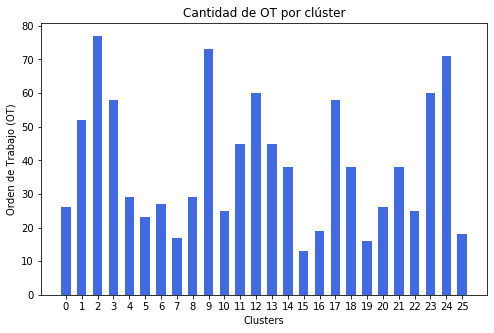

In [27]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=2, width = 0.6, save=save)

### 4. Tópico 3

In [28]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 3] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

952

Número óptimo de clústers: 18


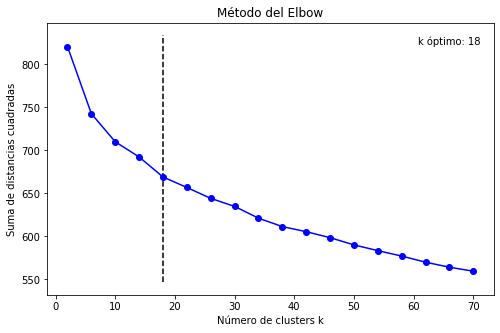

Wall time: 25.5 s


In [29]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=3, save=save)

In [30]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 18
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se realiza el cambio de 1 teclado preset quedando equipo despacho venta cliente operativo
	sentence  0 :  isla queda operativa chequeo de isla 1 encore 300 selector de producto 97 y display ppu no operativos se reconectan y se habilitan se prueban despachos preseteados de pos y de teclado se ajusta precorte y se jabilita para ventas
	sentence  1 :  isla queda operativa chequeo de isla 56 equipo se encuentra apagado desde el tablero electrico al momento de la visita se energiza y prueba equipo opera correctamente selectores y preset funcionan normal se indica que al momentonde la falla el equipo no permitia programar ventas se realiza master reset y se programa se prueban despachos preseteados equipo opera correctamente se habilita para ventas
	sentence  2 :  islas 2 y 7 quedan operativas cuequeo de islas dispenser 2 advantage presenta falla en selectores de producto se reemplazan switch 93 95 y 97 se resetea contador de fallas y habilita para ventas isla 7 presen

	sentence  25 :  administrador estacion solicita el cambio de 02 filtro en dispensador isla 5 y 6 ya que despacha demasiado lento luego del cambio de 02 filtros dispensador isla 5 y 6 3g2222 alto galonaje y queda despachando de forma normal a clientes repuestos utilizado 02 fiitros 70016 p14187 administrador estacion solicita el cambio de 02 filtro en dispensador isla 5 y 6 ya que despacha demasiado lento luego del cambio de 02 filtros dispensador isla 5 y 6 3g2222 alto galonaje y queda despachando de forma normal a clientes repuestos utilizado 02 fiitros 70016 p14187
	sentence  26 :  se realiza visita a estacion encontrando surtidor 3 y 4 despachando con normalidad se chequea interior de surtidor sin encontrar filtraciones se observa funcionamiento por mas de 2 horas con ventas a clientes despachando de forma normal se realiza visita a estacion encontrando surtidor 3 y 4 despachando con normalidad se chequea interior de surtidor sin encontrar filtraciones se observa funcionamiento por

In [31]:
# Clusters representativos 
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se realiza el cambio de 1 teclado preset quedando equipo despacho venta cliente operativo
Cluster  1 : se realiza revison de equipo y accesorio colgante encontrandose despacho venta cliente normal y flujo ok
Cluster  2 : dispensador n 2 presenta corte de breakaway en boca de diesel se realiza el cambio de 01 breakaway 34 quedando el equipo operativo dispensador n 2 presenta corte de breakaway en boca de diesel se realiza el cambio de 01 breakaway 34 quedando el equipo operativo
Cluster  3 : se realiza chequeo a equipo gasolinas 93 se realizan pruebas con ventas a clientes quedando operativo se realiza chequeo a equipo gasolinas 93 se realizan pruebas con ventas a clientes quedando operativo
Cluster  4 : se llega al punto para la revision de dispensador numero 1 por no despacho de diesel encontrandose esta operativa y con despachos normales todo operativo se llega al punto para la revision de dispensador numero 1 por no despacho de diesel encontrandose esta operativa y con 

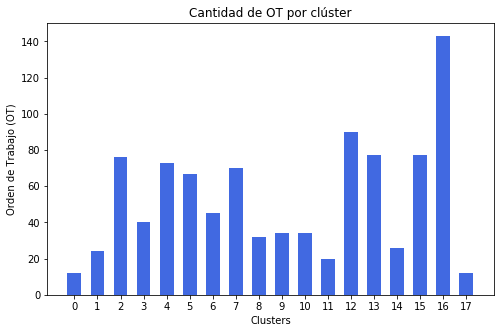

In [32]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=3, width = 0.6, save=save)

### 5. Tópico 4

In [33]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 4] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

2145

Número óptimo de clústers: 22


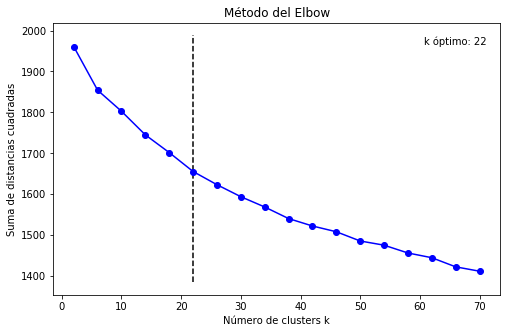

Wall time: 1min 5s


In [34]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=4, save=save)

In [35]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 22
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : incidencia es atendida bajo mantencion incidencia es atendida bajo mantencion
	sentence  0 :  incidencia fue atendida durante mantencion preventiva ot 27362
	sentence  1 :  incidencia atendida dentro de mantencion preventiva ot 27362
	sentence  2 :  incidencia sera cerrada bajo mantencion preventiva
	sentence  3 :  se realiza mantencion preventiva con contratista franco torrealba
	sentence  4 :  administracion no autoriza realizar mp se coordina para los proximos diasse realiza mantencion preventiva correspondiente
	sentence  5 :  se realiza mantencion preventiva correspondiente con contratista franco torrealba
	sentence  6 :  se realiza mantencion preventiva correspondiente con contratista franco torrealba
	sentence  7 :  se realiza mantencion preventiva correspondiente con contratista franco torrealba
	sentence  8 :  mantencion preventiva no se realiza ya que recinto se encuentra cerrado y no ha personal administrativo esto sucede desde febrero del 2019
	senten

	sentence  384 :  se realiza visita a estacion de servicio para efectuar cambio de precio en dispensador de kerosene se consulta a encargado el cual manifiesta que problema fue solucionado por empresa orpak se realiza visita a estacion de servicio para efectuar cambio de precio en dispensador de kerosene se consulta a encargado el cual manifiesta que problema fue solucionado por empresa orpak
	sentence  385 :  se realiza chequeo a estanque sin uso hace aprox de 2 anos en uso el estanque mantenia producto 95 administracion senala la posibilidad de habilitar estanque por encontrarse en mejor ubicacion en la estacion de servicio y es de mayor capacidad de litros administracion senala dar de baja estanque n5 de petroleo diesel debido a su mala ubicacion el cual estanque se encuentra ubicado casi en el paso de cebra peatonal casi en la calle y la personas transitan por sobre el estanque administracion senalan dar de baja estanque n5 oetroleo y habilitar el estanque sin uso se informa se cie

	sentence  56 :  incidencia se cierra bajo ot 20892
	sentence  57 :  incidencia se cierra bajo ot 19412
	sentence  58 :  incidencia se cierra bajo ot 21165
	sentence  59 :  se realiza atencion y cierre bajo ot 2 se realiza atencion y cierre bajo ot 2
	sentence  60 :  incidencia se atiende y cierra bajo ot 20076
	sentence  61 :  incidencia se cierra bajo la ot 20052
	sentence  62 :  incidencia se cierra bajo ot 19797
	sentence  63 :  se cierra bajo os 94553 se cierra orden bajo os 94553 ya que se cambia medidor 97 recuperando producto 95 ademas se toma muestra de diesel y se chequea en venta quedando equipo operativo
	sentence  64 :  se realiza cierre de maquina ya que se encontraba abierta quedsndo ok se realiza cierre de maquina ya que se encontraba abierta quedsndo ok
	sentence  65 :  se cierra bajo os 94614 se cierra bajo os 94614 por tratarse de misma falla
	sentence  66 :  se cierra bajo os 94657 se cierra bajo os 94657 por tratarse de mismo requerimiento
	sentence  67 :  incidenc

	sentence  27 :  se realiza pruebas de estatica y aire liquido en conjunto con personal de lec rechazando estatica y aprobando aire liquido se gestiona nueva visita para reparar priblemas en prueba estatica se cambian accesorios al momento de las pruebas queda pendiente pruebas de estatica
	sentence  28 :  se realizan priebas de estatica y aire liquido en conjunto con lec quedando eess aprobada se cambian breakaway rv collerin 3 tapas de descargas por fallas al momento de la prueba eess lista para cierre
	sentence  29 :  se realizan pruebas de estatica y aire liquido en eess junto a personal de lec pasando ambas pruebas eess aprobada eess queda lista para cierre
	sentence  30 :  se regulan parametros de pruebas en surtidores pendientes queda a la espera de lec eess cuenta con pruebas aprobadas en visita conjunta con lec queda certificada
	sentence  31 :  no se realiza pruebas de estatica y aire liquido debido por autorizacion denegada de jefa eess se realizan pruebas de estatica y aire

In [36]:
# Clusters representativos 
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : incidencia es atendida bajo mantencion incidencia es atendida bajo mantencion
Cluster  1 : incidencia fue atendida bajo la ot 2
Cluster  2 : retiro de contaminado en dispenser sump 56 7 y 8 incidencia sera atendida bajo ot 20365
Cluster  3 : incidencia no pertenece a sgs incidencia debe ser derivada a gilbarco
Cluster  4 : incidencia no corresponde a sgs por lo tanto se cierra ot
Cluster  5 : ot atendida incidencia cerrada
Cluster  6 : ot reasignada a otro contratista
Cluster  7 : incidencia esta siendo cotizada por ta se envia cotizacion a cliente para aprobacion cotizacion aprobada se solicita a supervisor coordinar trabajos con contratistacliente solicita que incidencia sea atendida bajo la ot 8 por lo cual se procede al cierre de esta
Cluster  8 : incidencia atendida bajo ot 9
Cluster  9 : incidencia se cierra bajo ot 2
Cluster  10 : incidencia esta siendo atendida bajo la ot 8
Cluster  11 : incidencia atendida bajo ot 20892
Cluster  12 : incidencia atendida bajo la ot

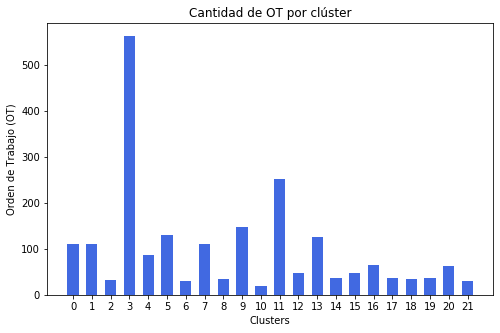

In [37]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol, nro_top=4, width = 0.6, save=save)

### 6. Tópico 5

In [38]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 5] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

581

Número óptimo de clústers: 18


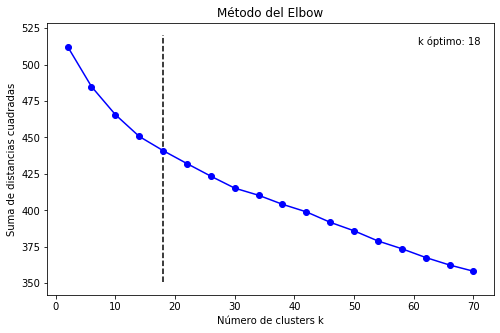

Wall time: 14 s


In [39]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=5, save=save)

In [40]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 18
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se chequea dispensador numero 4 de gas 93 lo cual al despachar combustible corta la venta motivo por el cual se encuentra medidor trabado se solicita 01 medidor advantage para su reemplazo sin stock se realiza instalacion de medidor a surtidor numero 4 de gas 93 por encontrarse trabado se recircula producto para ver su funcionamiento quedando despachando de forma normal ot cerrada medidor proviene de banco de pruebas se chequea dispensador numero 4 de gas 93 lo cual al despachar combustible corta la venta motivo por el cual se encuentra medidor trabado se solicita 01 medidor advantage para su reemplazo sin stock se realiza instalacion de medidor a surtidor numero 4 de gas 93 por encontrarse trabado se recircula producto para ver su funcionamiento quedando despachando de forma normal ot cerrada medidor proviene de banco de pruebas
	sentence  0 :  se realiza la reparacion de dos medidores que se trancan al momento de despacho con 95 dispensador 2 y 4 se prueban que

In [41]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se chequea dispensador numero 4 de gas 93 lo cual al despachar combustible corta la venta motivo por el cual se encuentra medidor trabado se solicita 01 medidor advantage para su reemplazo sin stock se realiza instalacion de medidor a surtidor numero 4 de gas 93 por encontrarse trabado se recircula producto para ver su funcionamiento quedando despachando de forma normal ot cerrada medidor proviene de banco de pruebas se chequea dispensador numero 4 de gas 93 lo cual al despachar combustible corta la venta motivo por el cual se encuentra medidor trabado se solicita 01 medidor advantage para su reemplazo sin stock se realiza instalacion de medidor a surtidor numero 4 de gas 93 por encontrarse trabado se recircula producto para ver su funcionamiento quedando despachando de forma normal ot cerrada medidor proviene de banco de pruebas
Cluster  1 : cambio de medidor se realiza el cambio de medidor de producto 97 en pos 2 se revisa funcionamiento y calibracion quedando operativo 

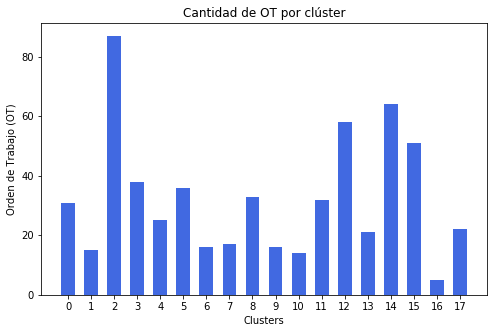

In [42]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=5, width = 0.6, save =save)

### 7. Tópico 6

In [43]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 6] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

483

Número óptimo de clústers: 30


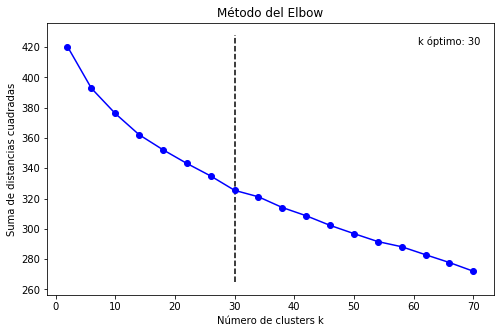

Wall time: 11.8 s


In [44]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=6, save = save)

In [45]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 30
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se realiza visita a estacion encontrando dispensador 5 boca 18gas 97 con breakaway cortado se procede al cambio de este quedando dispensador operativo se recircula producto para pruebas de funcionamiento se realiza visita a estacion encontrando dispensador 5 boca 18gas 97 con breakaway cortado se procede al cambio de este quedando dispensador operativo se recircula producto para pruebas de funcionamiento
	sentence  0 :  se realiza visita a estacion encontrando breakaway danado en dispensador 1 boca 2gas 97 se procede a la instalacion de 1 breakaway 34 rv nuevo quedando boca operativa y sin filtracion se recircula producto para pruebas de funcionamiento se realiza visita a estacion encontrando breakaway danado en dispensador 1 boca 2gas 97 se procede a la instalacion de 1 breakaway 34 rv nuevo quedando boca operativa y sin filtracion se recircula producto para pruebas de funcionamiento
	sentence  1 :  se realiza chequeo a equipo se desabilitan 2 bocas de producto 

In [46]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se realiza visita a estacion encontrando dispensador 5 boca 18gas 97 con breakaway cortado se procede al cambio de este quedando dispensador operativo se recircula producto para pruebas de funcionamiento se realiza visita a estacion encontrando dispensador 5 boca 18gas 97 con breakaway cortado se procede al cambio de este quedando dispensador operativo se recircula producto para pruebas de funcionamiento
Cluster  1 : se realiza chequeo a equipo dispensador se chequean boca n9 producto 93 y boca n10 producto 97 se realizan pruebas de recirculacion de producto se realizan pruebas con ventas a clientes equipo no presenta falla equipo operando despachos ok quedando operativo se realiza chequeo a equipo dispensador se chequean boca n9 producto 93 y boca n10 producto 97 se realizan pruebas de recirculacion de producto se realizan pruebas con ventas a clientes equipo no presenta falla equipo operando despachos ok quedando operativo
Cluster  2 : al momento de la visita surtidor n3

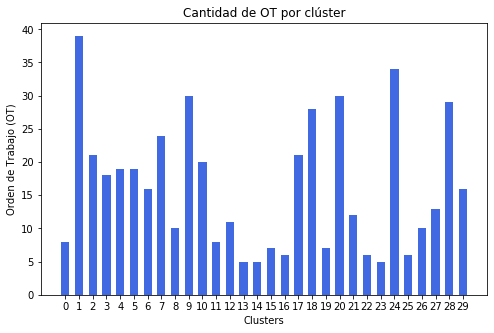

In [47]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=6, width = 0.6, save = save)

### 8. Tópico 7

In [48]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 7] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

1014

Número óptimo de clústers: 22


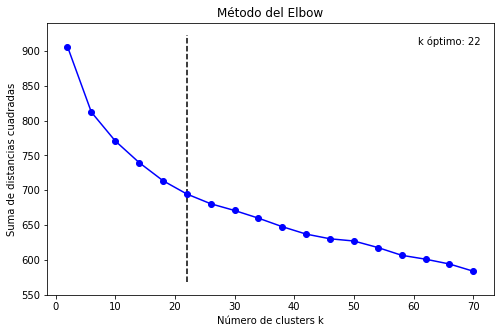

Wall time: 27.4 s


In [49]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=7, save = save)

In [50]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 22
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se chequeo equipo y se encontro suelta la caneria que conecta a la valvula proporcional generando fuga se ajusta caneria eliminando filtracion se realizan pruebas sin presentar falla quedando equipo operativo y sin filtracion
	sentence  0 :  se realiza reemplazo fusible de valvula de impacto se prueba equipo quedando operativo equipo queda operativo con todas sus bocas se realiza reemplazo fusible de valvula de impacto se prueba equipo quedando operativo equipo queda operativo con todas sus bocas
	sentence  1 :  se asiste a eds encontrando equipo chocado en el suelo se observa valvula opw de seguridad cortada puerta de display danada y descuadrada enchufe de fuente de poder danado y base donde se ancla equipo esta en mal estado equipo queda desconectado electricamente desde tablero por seguridad se chequea valvula para poder dejar 2 equipos octuples trabajando
	sentence  2 :  se chequeo equipo y se encontro suelta la caneria que conecta a la valvula proporcional 

	sentence  88 :  se realiza el cambio de 1 correa de motor quedando equipo operativo
Cluster 14 : se realiza revison de equipo encontrandose despacho ok
	sentence  0 :  se realiza revision de equipo encontrandose despacho operativo
	sentence  1 :  se realiza revison de equipo encontrandose despacho ok
	sentence  2 :  se realiza revison de equipo encontrandose con despacho ok
	sentence  3 :  se realiza revison de equipo y tablero encontrandose despacho a buses ok
	sentence  4 :  se realiza revison de equipo encontrandose despacho ok
	sentence  5 :  se realiza revision de equipo encontrandose despacho ok
	sentence  6 :  se realiza revison de equipo encontrandose despacho ok
	sentence  7 :  se realiza revison de equipo encontrandose ok
	sentence  8 :  se realiza revison de equipo encontrandose despacho ok
	sentence  9 :  se realiza revison de equipo encontandose despacho venta cliente operativo
	sentence  10 :  se realiza revison de equipo encontrandose despacho ok
	sentence  11 :  se rea

In [51]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se chequeo equipo y se encontro suelta la caneria que conecta a la valvula proporcional generando fuga se ajusta caneria eliminando filtracion se realizan pruebas sin presentar falla quedando equipo operativo y sin filtracion
Cluster  1 : se realiza revison de equipo y accesorios colgantes encontrandose despacho ok
Cluster  2 : se realiza el cambio de 1 breackaway rv quedando equipo operativo
Cluster  3 : equipo operativo equipo operativo
Cluster  4 : se realiza el cambio de 1 porta pistola equipo b23 bp quedando despacho ok
Cluster  5 : se guarda balde vacio en camioneta se realiza cambio de filtro ya que equipo en producto diesel se encontraba el flujo disminuido se realizan pruebas de recirculacion quedando equipo operativo y sin filtraciones
Cluster  6 : se realiza reconeccion de breackaway rv quedando equipo despacho venta cliente operativo
Cluster  7 : se realiza reparacion y fijacion de palanca de accionamiento quedando equipo despacho venta cliente operativo
Cluste

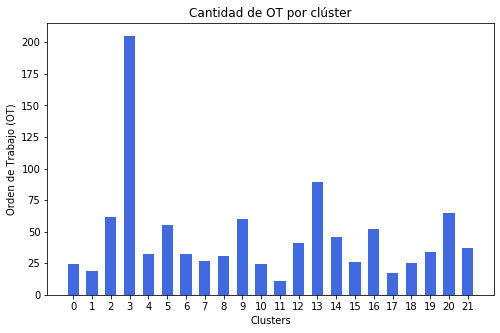

In [52]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=7, width = 0.6, save = save)

### 9. Tópico 8

In [53]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 8] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

646

Número óptimo de clústers: 22


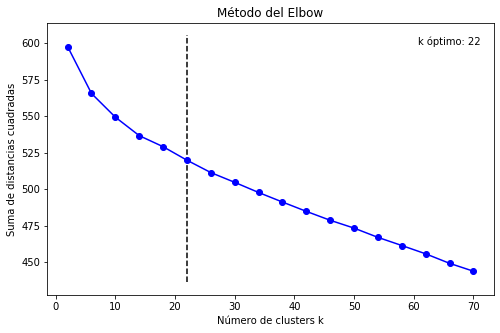

Wall time: 15.7 s


In [54]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=8, save = save)

In [55]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 22
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : sin pruebas tapa de tanque 2 97 se instala oring quedando ok
	sentence  0 :  se verifica camara estanque danada se adjuntan fotos
	sentence  1 :  se chequea falla y se detecta surtidor fura de lugar sin anclaje se ancla surtidor a base colocando pernos de seguridad y fijando se realiza el cambio de codo articulado con fuga queda todo operativo en un 100 se chequea falla y se detecta surtidor fura de lugar sin anclaje se ancla surtidor a base colocando pernos de seguridad y fijando se realiza el cambio de codo articulado con fuga queda todo operativo en un 100
	sentence  2 :  se chequean surtidores encontrandose en condiciones normales se adjuntan fotos se chequean surtidores encontrandose en condiciones normales se adjuntan fotos
	sentence  3 :  se realiza revision de bomba centrifuga descartando falla en esta se revisa linea de succion detectando problema en sump de estanque 93 se recomienda modificar linea de pos 78 producto 93 se adjuntan fotos se realiza revi

In [56]:
# Clusters representativos 
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : sin pruebas tapa de tanque 2 97 se instala oring quedando ok
Cluster  1 : se realiza el cambio de 1 tapa caja vereda y 1 tapa adaptador descarga 4 quedando ok
Cluster  2 : se cambia tapa cano 4 de gas 93 quebrada queda operativa se cambia tapa cano 4 de gas 93 quebrada queda operativa se cambian accesorios en lado 1 de diesel pir filtraciones ademas tapa de 4 a spill descargas de gas93 quebrada queda pendiente el cambio de una tapa de 4 spill gas97 se hara a la brevedad posible se cambia tapa de cano 4 descarga rota gas97 queda operativa se cambia tapa cano 4 de gas 93 quebrada queda operativa se cambia tapa cano 4 de gas 93 quebrada queda operativa se cambian accesorios en lado 1 de diesel pir filtraciones ademas tapa de 4 a spill descargas de gas93 quebrada queda pendiente el cambio de una tapa de 4 spill gas97 se hara a la brevedad posible se cambia tapa de cano 4 descarga rota gas97 queda operativa
Cluster  3 : se realiza el cambio de 01 tapa de descarga de 4 en el tk 

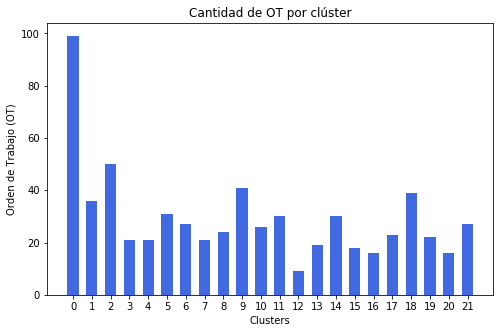

In [57]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=8, width = 0.6, save = save)

### 10. Tópico 9

In [58]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 9] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

615

Número óptimo de clústers: 18


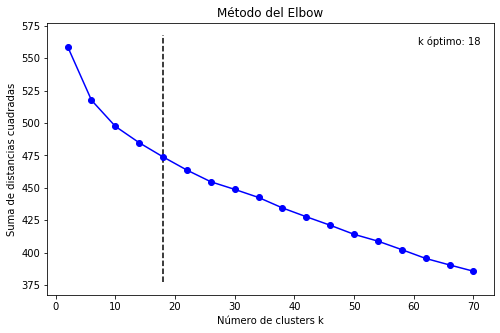

Wall time: 14.3 s


In [59]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=9, save = save)

In [60]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 18
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se chequea falla y se detecta fuga por uniones de diesel se realiza sellado y se prueba queda operativo en un 100 se chequea falla y se detecta fuga por uniones de diesel se realiza sellado y se prueba queda operativo en un 100
	sentence  0 :  se chequea falla y se detecta fuga en teeminal superior se realiza reapriete quedando operativo en un 100 se chequea falla y se detecta fuga en terminal superior se realiza reapriete quedando operativo en un 100
	sentence  1 :  en dispensador numero 12 se detecto filtracion uniones wipehose breakaways manguera 34 se rearma completo accesorios del diesel se realizan pruebas con ventas quedando operativo en dispensador numero 12 se detecto filtracion uniones wipehose breakaways manguera 34 se rearma completo accesorios del diesel se realizan pruebas con ventas quedando operativo
	sentence  2 :  se chequea falla detectando accesorios en mal estado que parten marcando y cortan muy seguido por problemas en sensor se realiza sell

In [61]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se chequea falla y se detecta fuga por uniones de diesel se realiza sellado y se prueba queda operativo en un 100 se chequea falla y se detecta fuga por uniones de diesel se realiza sellado y se prueba queda operativo en un 100
Cluster  1 : se revisa dispensador octuple lado 3 por falla descrita y se detecta falla en valvula mezcla e limpian y cambian oring pero persiste el problema se solicita cambio de valvula para cierre de os queda operando se revisa dispensador octuple lado 3 y se cambia valvula proporcional de gas97 con falla se prueba recirculando producto queda funcionando normal se revisa dispensador octuple lado 3 por falla descrita y se detecta falla en valvula mezcla e limpian y cambian oring pero persiste el problema se solicita cambio de valvula para cierre de os queda operando se revisa dispensador octuple lado 3 y se cambia valvula proporcional de gas97 con falla se prueba recirculando producto queda funcionando normal
Cluster  2 : se revisa dispensador oct

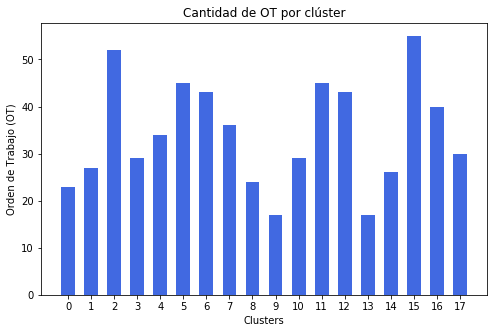

In [62]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=9, width = 0.6, save = save)

### 11. Tópico 10

In [63]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 10] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

549

Número óptimo de clústers: 26


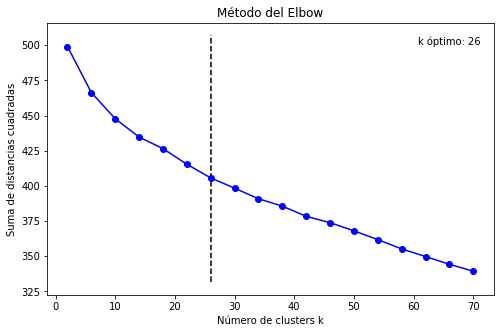

Wall time: 13.6 s


In [64]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=10, save = save)

In [65]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 26
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : dispensadores de eds se encuentran con adhesivos boca tk capacidad en mal estado se solicita 26 adhesivos para su reemplazo se instalan 26 adhesivos boca estanque identificando todas las bocas de la estacion dispensadores de eds se encuentran con adhesivos boca tk capacidad en mal estado se solicita 26 adhesivos para su reemplazo se instalan 26 adhesivos boca estanque identificando todas las bocas de la estacion
	sentence  0 :  46 adhesivos instalados se rotulan e instalan 46 adhesivos de identificacion boca estanque p13093 en islas 12 34 56 78 1112 31 910 diesel y 1314 kerosene
	sentence  1 :  se procede a remarcar adhesivos boca estanque de disp 56 por estar poco visible quedando ok se procede a remarcar adhesivos boca estanque de disp 56 por estar poco visible quedando ok
	sentence  2 :  adhesivos instalados se reponen adhesivos deinstruccion de carga en islas 10 y 11 12 se reponen adhesivos de identificacion boca estanque de isla 10
	sentence  3 :  dispensado

In [66]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : dispensadores de eds se encuentran con adhesivos boca tk capacidad en mal estado se solicita 26 adhesivos para su reemplazo se instalan 26 adhesivos boca estanque identificando todas las bocas de la estacion dispensadores de eds se encuentran con adhesivos boca tk capacidad en mal estado se solicita 26 adhesivos para su reemplazo se instalan 26 adhesivos boca estanque identificando todas las bocas de la estacion
Cluster  1 : se realiza la instalacion de 2 detectores de fuga quedando ok se realiza normalizacion a tk 3 diesel detector de fuga veeder root fx1dv elemento funcional kit de valvula check normalizacion a tk 4 gas 97 detector de fuga fx1v elemento funcional kit valvula chack ambas quedan funcionando se realiza la instalacion de 2 detectores de fuga quedando ok se realiza normalizacion a tk 3 diesel detector de fuga veeder root fx1dv elemento funcional kit de valvula check normalizacion a tk 4 gas 97 detector de fuga fx1v elemento funcional kit valvula chack ambas q

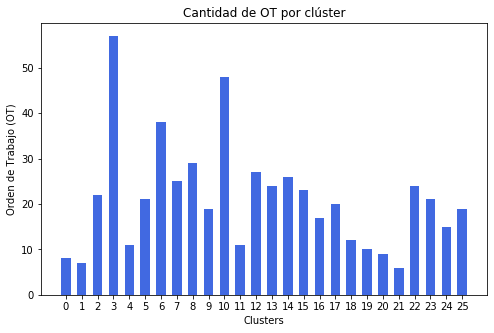

In [67]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=10, width = 0.6, save = save)

### 12. Tópico 11

In [68]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 11] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

823

Número óptimo de clústers: 18


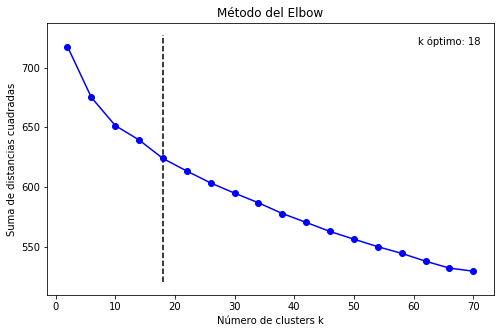

Wall time: 25.6 s


In [69]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=11, save = save)

In [70]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 18
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se realiza extraccion de agua de tk 1 diesel 70 litros aproximadamente y tk 5 kerosene 50 litros aproximadamente tambor fue proporcionado por administrador de eds tk quedan operativos agua tk 1 diesel y tk 5 kerosene
	sentence  0 :  se realiza extraccion de agua de tk 1 diesel 70 litros aproximadamente y tk 5 kerosene 50 litros aproximadamente tambor fue proporcionado por administrador de eds tk quedan operativos agua tk 1 diesel y tk 5 kerosene
	sentence  1 :  se realiza verificacion de niveles de agua en tk 5 kerosene detectando 32 cm de agua se procede a efectuar la extraccion del agua retirando aprox 70 ltrs los cuales quedan en tambor de la eds tk kerosene queda sin agua se realiza verificacion de niveles de agua en tk 5 kerosene detectando 32 cm de agua se procede a efectuar la extraccion del agua retirando aprox 70 ltrs los cuales quedan en tambor de la eds tk kerosene queda sin agua
	sentence  2 :  se realiza el retiro de 350 litros de agua aproximadament

	sentence  24 :  se visita eds encontrando agua en tk 3 y 4 diesel se realizan mediciones con regla marcando 250 litros aprox tk4 y 180 litros aprox tk 3 se retira agua se chequean todos los estanques de combustible quedando estanques sin presencia de agua se limpian probetas de telemedicion se reemplazan 02 tapas cg p16264 tapa adptador descarga 4 opw las que no acoplan hermeticamente agua retirada de tk es contenida en 02 tambores quedando en la eds se visita eds encontrando agua en tk 3 y 4 diesel se realizan mediciones con regla marcando 250 litros aprox tk4 y 180 litros aprox tk 3 se retira agua se chequean todos los estanques de combustible quedando estanques sin presencia de agua se limpian probetas de telemedicion se reemplazan 02 tapas cg p16264 tapa adptador descarga 4 opw las que no acoplan hermeticamente agua retirada de tk es contenida en 02 tambores quedando en la eds
	sentence  25 :  se realiza chequeo con pasta de agua en tk producto 93 diesel kerosene encontrandose lim

In [71]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se realiza extraccion de agua de tk 1 diesel 70 litros aproximadamente y tk 5 kerosene 50 litros aproximadamente tambor fue proporcionado por administrador de eds tk quedan operativos agua tk 1 diesel y tk 5 kerosene
Cluster  1 : se procede a retiro de agua en estanques se chequea tk 1 producto diesel encontrando 500 lts de agua en su interior agua contaminada queda en tambores en eess
Cluster  2 : camaras sump producto kerosene llena aprox 800lts producto 93 400 lts aprox producto 95 400 lts aprox producto 97 600 lts aprox producto diesel 250 lts capas superficiales de viruxlex interior sump antiderrame dispensadores se encuentran danados generando condiciones inseguras se deja registro fotografico en app tablet dispensadores isla 1 y isla 2 e isla 3 se realiza calibracion de dispensadores 1234 con un total de 16 bocas calibradas se chequean fugaz interior y exterior se chequea agua estanque estanque 1 producto kerosene 100 litros es tanque 2 de productos 93 250 litros ap

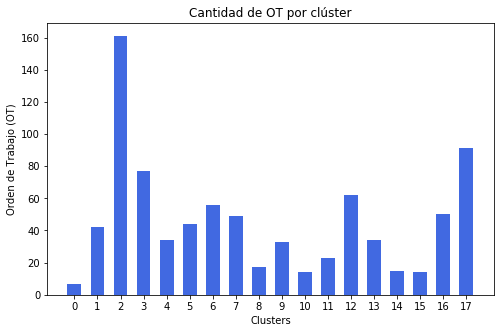

In [72]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=11, width = 0.6, save = save)

### 13. Tópico 12

In [73]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 12] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

797

Número óptimo de clústers: 30


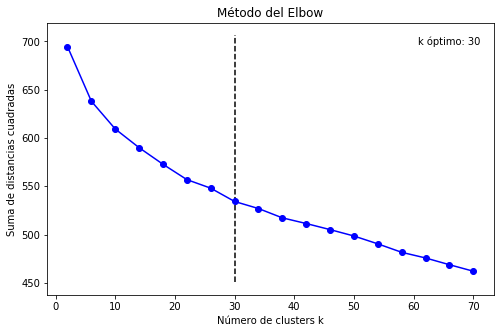

Wall time: 19.7 s


In [74]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=12, save = save)

In [75]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 30
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : lado 2 se extrae 12ltrs 95 para pruebas lado 2 se cambia breakaway manguera y pistola vapor por estar en mal estado quedando operativo considerar p16674 1 breakaway vapor mas p14774 1 pistola vapor por no tener stock en tablet
	sentence  0 :  se cambia breakaway y manguera rv lado 5 debido que cliente arranco accesorios equipo operativo repuestos p16674 breakaway rv 1 p14517 manguera rv 1 se cambia breakaway y manguera rv lado 5 debido que cliente arranco accesorios equipo operativo repuestos p16674 breakaway rv 1 p14517 manguera rv 1
	sentence  1 :  se extrae 93 lado 6 3 litros para pruebas se realiza cambio de breakaway vapor quedando ok considerar 1 breakaway vapor p16674 por no tener stock en tablet
	sentence  2 :  lado 7 se extrae 4 litros 93 para pruebas se realiza cambio de breakaway vapor a lado 7 quedando ok considerar 1 breakaway vapor p16674 por no tener stock en tablet
	sentence  3 :  lado 4 se extrae 4ltrs 97 para pruebas lado 4 97 se cambia pistola 

	sentence  69 :  se realiza el cambio de 01 breakaway 34 ya que se encuentra cortadose realiza prueba boca n 12 gas 93 queda operativa repuesto utilizado 01 breakaway 34 codigo repuesto p13430 se realiza el cambio de 01 breakaway 34 ya que se encuentra cortadose realiza prueba boca n 12 gas 93 queda operativa repuesto utilizado 01 breakaway 34 codigo repuesto p13430
	sentence  70 :  se realiza cambio de turbina quedando operativo la turbina pertenece a la bodega de rene devia
	sentence  71 :  e realiza revision a dispensador isla 3 y 4 el cual no funcionasin despacho se mide corriente en dispensador llegando 220v a fuente poder pero 0 volt en salida de 24 volt igem apada se realiza el cambio de 01 fuente poder 3g luego se hacen pruebas despacho producto disoensador iska 3 y 4 queda operativo tambien se cambia 01 ampollrta ahorro energia dispensador iska 3 y4 repuestos utilizados 01 fuente poder 3g codigo repuesto p15952 01 apolleta ahorro energia repuesto fue comprado en la zona se rea

In [76]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : lado 2 se extrae 12ltrs 95 para pruebas lado 2 se cambia breakaway manguera y pistola vapor por estar en mal estado quedando operativo considerar p16674 1 breakaway vapor mas p14774 1 pistola vapor por no tener stock en tablet
Cluster  1 : se cambia 1 manguera de 34 rv bocas gas 93
Cluster  2 : se realiza el cambio de 1 manguera 1 x 5 mts quedando equipo operativo
Cluster  3 : se realiza cambio de manguera quedando equipo operativo
Cluster  4 : se realiza el cambio de 1 pistola rv 1 manguera rv y 1 manguera 34 conv quedando equipo operativo
Cluster  5 : se chequea dispensador encontrandose 3 mangueras de 95 posicion 3 y 1 danadas y manguera de posicion 1 diesel 34 x32 mts se cambian quedando normales se chequea dispensador encontrandose destorsedores de bocas 12 de 97 danados se cambian quedando normales
Cluster  6 : se realiza el cambio de 1 manguera rv quedando equipo operativo
Cluster  7 : chequeo funcionamiento y verificacion volumerrica a 2 dispensadores se realiza el

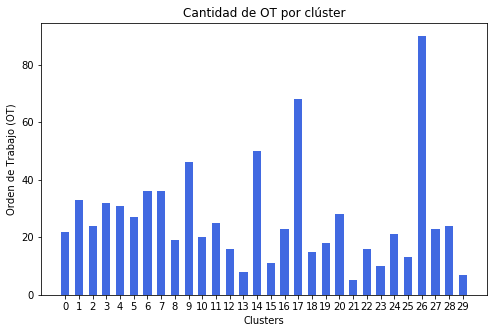

In [77]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=12, width = 0.6, save = save)

### 14. Tópico 13

In [78]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 13] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

1122

Número óptimo de clústers: 22


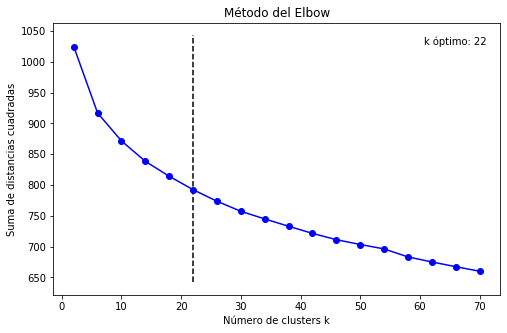

Wall time: 25.6 s


In [79]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=13, save = save)

In [80]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 22
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : surt 4 d se realizo remplazo de una manguera 34 conv p14516 surt 4 d se realizo remplazo de un swivel de 34 opw p19587 surt 34 se chequea surt por aparente falla se encontro funcionando ok en recirculaciones de prueba no presenta problemas repuestos remplazados quedan en servicentro surt 4 d se realizo remplazo de una manguera 34 conv p14516 surt 4 d se realizo remplazo de un swivel de 34 opw p19587 surt 34 se chequea surt por aparente falla se encontro funcionando ok en recirculaciones de prueba no presenta problemas repuestos remplazados quedan en servicentro
	sentence  0 :  surt 2d se realizo reinstalacion de calzo de pistola quedo surt funcionando ok surt 2d se realizo reinstalacion de calzo de pistola quedo surt funcionando ok
	sentence  1 :  surt 1 d se realizo remplazo de una manguera conv 34 surt 2 se realizo remplazo de dos ampolletas de 9w manguera remplazada queda en servicentro surt 1 d se realizo remplazo de una manguera conv 34 surt 2 se realizo rem

	sentence  26 :  se realiza toma de muestra
	sentence  27 :  se realiza toma de muestra
	sentence  28 :  se realiza toma de muestra
Cluster 16 : disp 1 d se realiza recirculacion para hacer toma de muestras disp 1 d se realiza recirculacion para hacer toma de muestras
	sentence  0 :  surt 8d se saco y reinstalo manguera de 1 para intercambiar por la del disp 10d intercambio realizado a peticion de encargado disp3 9593 y 497 presentan falla por dano en sus accesorios se informa de esta situacion a encargada surt 8d se saco y reinstalo manguera de 1 para intercambiar por la del disp 10d intercambio realizado a peticion de encargado disp3 9593 y 497 presentan falla por dano en sus accesorios se informa de esta situacion a encargada
	sentence  1 :  disp 1295 se gun informacion de encargado en este disp recibio reclamos por que el disp no entrega lts reales se coordinara en su proxima mp el chequeo y calibracion de estas bocas disp 1295 se gun informacion de encargado en este disp recibio r

In [81]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : surt 4 d se realizo remplazo de una manguera 34 conv p14516 surt 4 d se realizo remplazo de un swivel de 34 opw p19587 surt 34 se chequea surt por aparente falla se encontro funcionando ok en recirculaciones de prueba no presenta problemas repuestos remplazados quedan en servicentro surt 4 d se realizo remplazo de una manguera 34 conv p14516 surt 4 d se realizo remplazo de un swivel de 34 opw p19587 surt 34 se chequea surt por aparente falla se encontro funcionando ok en recirculaciones de prueba no presenta problemas repuestos remplazados quedan en servicentro
Cluster  1 : se realiza toma de muestra de est 2 93 desde disp 1 93 quedando ok se realiza toma de muestra de est 2 93 desde disp 1 93 quedando ok
Cluster  2 : disp293 se realizo remplazo de un breckawey rv opw reco disp 1293 se realizo remplazo de un filtro baja cap disp 1516 d se realizo remplazo de 2 swivel de 1 disp 16d se realizo remplazo de un cano de 1 disp 4d se realizo remplazo de un swivel de 34 disp 495 s

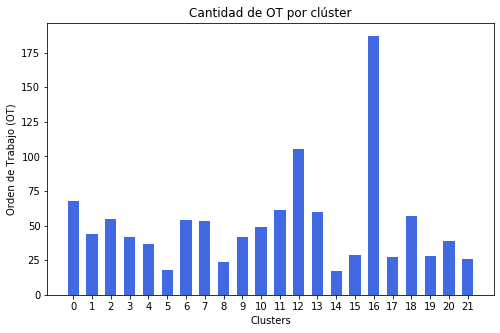

In [82]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=13, width = 0.6, save = save)

### 15. Tópico 14

In [83]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 14] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

797

Número óptimo de clústers: 22


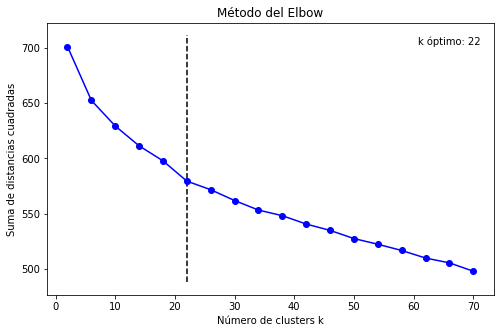

Wall time: 22 s


In [84]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=14, save = save)

In [85]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 22
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se chequea surtidor 2 de 93 el cual se encuentra con su polea de centrifuga danada fuera de su eje se cambia seguro de polea y se ajusta quedando normal a de mas se chequea surtidor boca 4 diesel por encontrarse con filtraciones en valvula de retencion de estanque se repara valvula de retencion eliminando filtraciones y se instala 1 valbula scheck conica en union americana se cambia 1 filtro diesel se prueba equipo despachando normal se chequea surtidor 2 de 93 el cual se encuentra con su polea de centrifuga danada fuera de su eje se cambia seguro de polea y se ajusta quedando normal a de mas se chequea surtidor boca 4 diesel por encontrarse con filtraciones en valvula de retencion de estanque se repara valvula de retencion eliminando filtraciones y se instala 1 valbula scheck conica en union americana se cambia 1 filtro diesel se prueba equipo despachando normal
	sentence  0 :  se chequea surtidor 2 de 93 el cual se encuentra con su polea de centrifuga danada fu

	sentence  7 :  se realiza visita a estacion encontrando surtidor 3 y 4 bloqueados con codigo de error se procede a la limpieza de discos magneticos en ambos medidores quedando bocas operativas se recirculan 340 litros sin presentar problemas de funcionamiento se realiza visita a estacion encontrando surtidor 3 y 4 bloqueados con codigo de error se procede a la limpieza de discos magneticos en ambos medidores quedando bocas operativas se recirculan 340 litros sin presentar problemas de funcionamiento
	sentence  8 :  se realiza chequeo a surtidor n1 y n2 producto p diesel se realiza nuevamente limpieza de filtros en unidad de bombeo y discos magneticos valvulad check en medidor del surtidor se encontraron con suciedad se suguiere a administracion de la estacion de servicio despues de realizar descarga de combustibles esperar un tiempo razonable antes de comenzar las ventas y no trabajar con los puntos se realizan pruebas de recirculacion de producto no presentando falla quedando equipo 

In [86]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se chequea surtidor 2 de 93 el cual se encuentra con su polea de centrifuga danada fuera de su eje se cambia seguro de polea y se ajusta quedando normal a de mas se chequea surtidor boca 4 diesel por encontrarse con filtraciones en valvula de retencion de estanque se repara valvula de retencion eliminando filtraciones y se instala 1 valbula scheck conica en union americana se cambia 1 filtro diesel se prueba equipo despachando normal se chequea surtidor 2 de 93 el cual se encuentra con su polea de centrifuga danada fuera de su eje se cambia seguro de polea y se ajusta quedando normal a de mas se chequea surtidor boca 4 diesel por encontrarse con filtraciones en valvula de retencion de estanque se repara valvula de retencion eliminando filtraciones y se instala 1 valbula scheck conica en union americana se cambia 1 filtro diesel se prueba equipo despachando normal
Cluster  1 : equipo con oring quemados se cambia kit oring valvula proporcional a producto 97 se cambian 4 valv

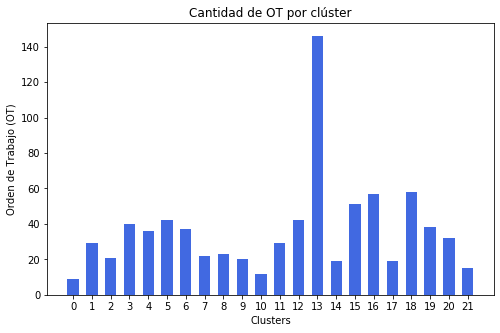

In [87]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=14, width = 0.6, save = save)

### 16. Tópico 15

In [88]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 15] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

1535

Número óptimo de clústers: 18


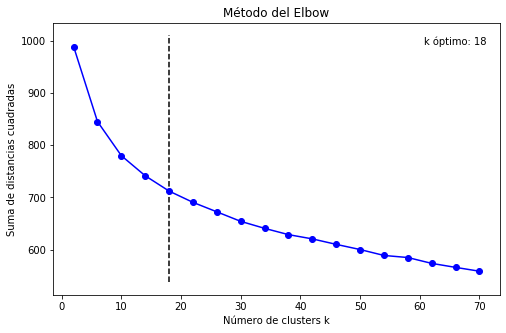

Wall time: 23.7 s


In [89]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=15, save = save)

In [90]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 18
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : mantencion preventiva mes de agosto solo calibracion todos los equipos quedandan trabajando bien y sin fuga de combustibles mantencion preventiva mes de agosto solo calibracion se realizo mantencion preventiva de los equipos a los cuales se le corrigio fuga y se calibraron quedando trabajando todos correctamente y sin fuga
	sentence  0 :  incidencia sera vista mediante la mantencion preventiva del mes de septiembre
	sentence  1 :  pintado de tapas se realiza mediante la mantencion preventiva completa
	sentence  2 :  pintado de tapas se realizara en su proxima mp completa
	sentence  3 :  verificacion volumetrica de 2626 bocas quedando operativas y dentro de norma se reemplazan sellos en medidores verificacion volumetrica de 2626 bocas quedando operativas y dentro de norma se reemplazan sellos en medidores
	sentence  4 :  calibracion 18 de 18 bocas quedando operativas y dentro de norma calibracion 18 de 18 bocas quedando operativas y dentro de norma se cambian sell

	sentence  4 :  programa mantencion preventiva mes septiembre 2019 calibracion 2019
	sentence  5 :  programa mantencion preventiva mes septiembre 2019
	sentence  6 :  programa mantencion preventiva mes septiembre 2019
	sentence  7 :  programa mantencion preventiva mes septiembre 2019
	sentence  8 :  programa mantencion preventiva mes septiembre 2019
	sentence  9 :  programa mantencion preventiva mes septiembre 2019
	sentence  10 :  programa mes septiembre 2019
	sentence  11 :  se realiza mantencion preventiva mes septiembre
	sentence  12 :  se realiza mantencion preventiva es de septiembre
	sentence  13 :  se realiza mantencion preventiva mes septiembre
	sentence  14 :  se realiza mantencion preventiva mes septiembre
	sentence  15 :  se realiza mantencion preventiva mes septiembre
	sentence  16 :  se realiza mantencion preventiva mes septiembre
	sentence  17 :  se realiza mantencion preventiva mes septiembre
	sentence  18 :  se realiza mantencion preventiva mes septiembre
	sentence  19

	sentence  159 :  sin recirculacion se pinta tapa de spill quedando ok tk 3 kerosene
	sentence  160 :  pendiente pintado de 8 spill disp 8 93 se realizoremplazo de un filtro de alta cap se realiza pintado de 8 spill con pintura roja amarillagris naranjo verde y blanco pendiente pintado de 8 spill disp 8 93 se realizoremplazo de un filtro de alta cap se realiza pintado de 8 spill con pintura roja amarillagris naranjo verde y blanco
Cluster 16 : mantencion preventiva mes de mayo se realiza mantencion preventiva se calibran 2 bocas se cambian accesorios
	sentence  0 :  se requiere cambi de despiche en spill dd kerosen
	sentence  1 :  se realiza mantencion preventiva y cambio de accesorios quedando todo operativo
	sentence  2 :  mantencion preventiva mes de agosto solo calibracion se realiza mantencion preventiva se realiza verificacion volumetrica se realiza el cambio de filtros y accesorios en mal estado se revisan camaras se realiza limpieza y sellado
	sentence  3 :  se realiza mantenci

In [91]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : mantencion preventiva mes de agosto solo calibracion todos los equipos quedandan trabajando bien y sin fuga de combustibles mantencion preventiva mes de agosto solo calibracion se realizo mantencion preventiva de los equipos a los cuales se le corrigio fuga y se calibraron quedando trabajando todos correctamente y sin fuga
Cluster  1 : se revisa en mantencion preventiva se revisa en mantencion preventiva
Cluster  2 : programa mantencion preventiva mes mayo 2019 calibracion verificacion detector de fuga se realiza mantencion preventiva a dispensadores lados 1 al 10 se realiza verificacion volumetrica con matraz de 20 litros a 34 bocas de 34 se revisan interior de equipos se revisan y prueban accesorios se revisan y limpian spill descargas quedan todos los equipos operativos programa mantencion preventiva mes mayo 2019 calibracion verificacion detector de fuga se realiza mantencion preventiva a dispensadores lados 1 al 10 se realiza verificacion volumetrica con matraz de 20 

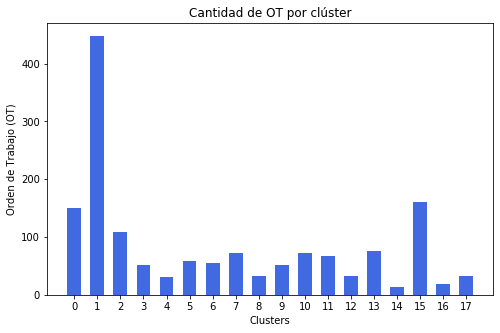

In [92]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=15, width = 0.6, save = save)

### 17. Tópico 16

In [93]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 16] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

1141

Número óptimo de clústers: 22


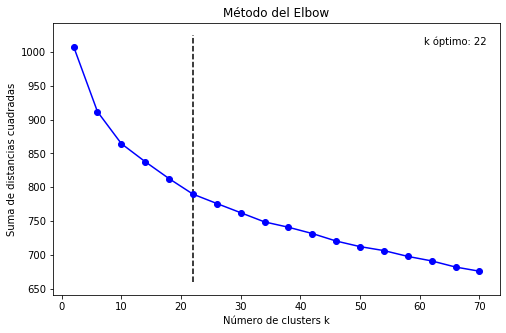

Wall time: 29.4 s


In [94]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=16, save = save)

In [95]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 16
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se realizo cambio de 2 filtros quedando equipos operativos
	sentence  0 :  se realiza el cambio de 1 filtro a surtidor boca 1 por encontrarse saturado se realizan pruebas quedando operativo
	sentence  1 :  se chequea falla detectando surtidores lentos y con fuga se realiza reapriete y sellado de todos los diesel se realiza cambio de filtros y se prueba queda operativo en un 100 se chequea falla detectando surtidores lentos y con fuga se realiza reapriete y sellado de todos los diesel se realiza cambio de filtros y se prueba queda operativo en un 100
	sentence  2 :  se chequea falla detectando problema en filtros saturados se realiza cambio de filtros y ajuste de parametros queda operativa en un 100 se chequea falla detectando problema en filtros saturados se realiza cambio de filtros y ajuste de parametros queda operativa en un 100
	sentence  3 :  se chequea falla y se detecta problema en filtro saturado de diesel se realiza cambio de filtro y se prueba queda ope

	sentence  28 :  se realiza trabajo en conjunto con adexus para cambio de caja orpak en pos 2 trabajo realizado sin inconvenientes se realizan pruebas quedando equipo operativo se cambia ampolleta pls 9 quemada en pos 2 se realiza trabajo en conjunto con adexus para cambio de caja orpak en pos 2 trabajo realizado sin inconvenientes se realizan pruebas quedando equipo operativo se cambia ampolleta pls 9 quemada en pos 2
	sentence  29 :  se chequea falla detectando ampolletas quemadas se cambia ampolletas queda operativo 100 se chequea falla detectando ampolletas quemadas se cambia ampolletas queda operativo 100
	sentence  30 :  se chequea falla y se rwaliza el cambio de ampoletas pls9 watts quemadas queda operstiva 100 se chequea falla y se rwaliza el cambio de ampoletas pls9 watts quemadas queda operstiva 100
	sentence  31 :  ampolletas quemadas cambio de 7 ampolletas de 7 watts a equipos octuples de gasolina equipo operativo
	sentence  32 :  es reemplazada 01 ampolleta 220 volt 7 watt

In [96]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se realizo cambio de 2 filtros quedando equipos operativos
Cluster  1 : se cambian 3 filtros en bocas diesel
Cluster  2 : se realiza el cambio 2 filtros baja capacidad y 1 filtro spin on quedando equipo operativo
Cluster  3 : chequeo funcionamiento y verificacion volumetrica a 3 dispensadores y 1 surtidor en total se verfican 25 de 26 boca nro 26 kerosene fuera de servicio por administracion cambio 1 filtro dispensador nro 1 diesel flujo lento antes 20lpm despues 38lpm cambio 1 filtro dispensador nro 2 gas 93 antes 23lpm despues 38lpm cambio 1 filtro dispensador nro 3 diesel antes 25lom despues 40lpm cambio 1 ampolleta 9 watt quemada dispensador nro 1 cambio fundas roja boca nro 2 gas 97 boca nro 4 gas 93 y boca nro 7 gas 95 con rotura limpieza y pintado spill chequeo funcionamiento y verificacion volumetrica a 3 dispensadores y 1 surtidor en total se verfican 25 de 26 boca nro 26 kerosene fuera de servicio por administracion cambio 1 filtro dispensador nro 1 diesel flujo 

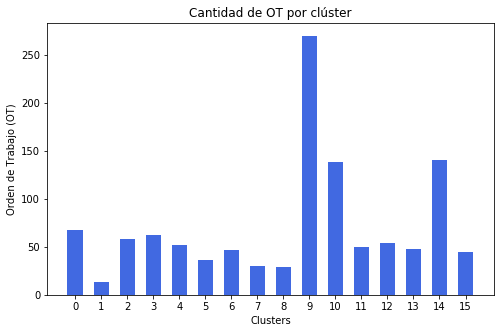

In [97]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=16, width = 0.6, save = save)

### 18. Tópico 17

In [98]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 17] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

628

Número óptimo de clústers: 14


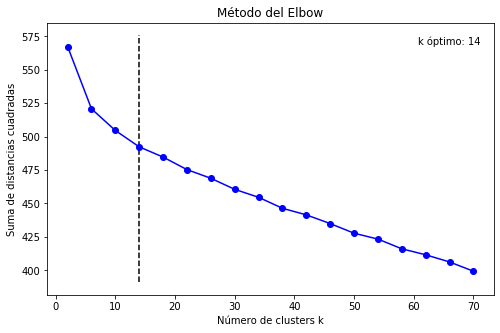

Wall time: 15.1 s


In [99]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=17, save = save)

In [100]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 14
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se realiza master reset en disp 56 por estar bloqueado y no despachar producto quedando operativo se realizan pruebas con ventas se realiza master reset en disp 56 por estar bloqueado y no despachar producto quedando operativo se realizan pruebas con ventas
	sentence  0 :  se realiza revision y master reset a dispensador numero 10 quedando esta operativa dispensador numero 15 no presenta fallas al momento de la revision de igual forma se realiza master reset quedando operativa se realiza revision y master reset a dispensador numero 10 quedando esta operativa dispensador numero 15 no presenta fallas al momento de la revision de igual forma se realiza master reset quedando operativa
	sentence  1 :  se realiza master reset en disp 12 por tener problemas en despacho y detenerse quedando operativo se realiza master reset en disp 12 por tener problemas en despacho y detenerse quedando operativo
	sentence  2 :  en dispensador numero 7 y 8 se realiza master reset y repro

In [101]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se realiza master reset en disp 56 por estar bloqueado y no despachar producto quedando operativo se realizan pruebas con ventas se realiza master reset en disp 56 por estar bloqueado y no despachar producto quedando operativo se realizan pruebas con ventas
Cluster  1 : se realiza master reset y reprogramacion de parametros quedando equipo despacho venta cliente operativo
Cluster  2 : islas operativas se indica que islas 2 y 3 presentan error en despachos ventas no figuran en pos para cobro se revisa reporte de despachos por isla ventas coinciden con equipos y horarios se verifica funcionamiento de equipos numerales sin error accesorios sin fallas problema corresponde a error en operacion del equipo dispensador se habilita para ventas
Cluster  3 : informan nuevamente falla en el dispensador n 34 el cual se detiene antes de lo programado se verifican los despachos en cem 44 en donde la falla se presenta de manera intermitente con todos los productos con anterioridad ya se h

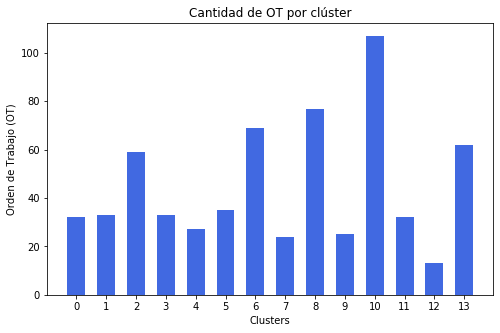

In [102]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=17, width = 0.6, save = save)

### 19. Tópico 18

In [103]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 18] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

559

Número óptimo de clústers: 18


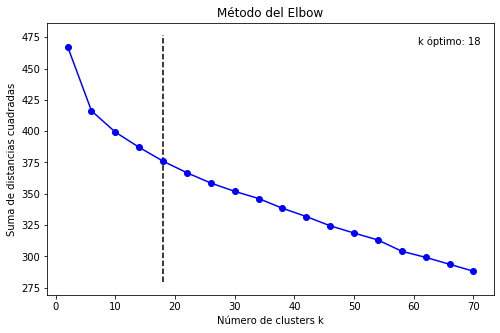

Wall time: 14 s


In [104]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=18, save = save)

In [105]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 18
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : verificacion volumetrica a dispensador isla 1 y 2 bocas 1 a la 8 limpieza de equipo chequeo de pistolas chequeo de preset revision de adhesivos boca tk cambio de filtros cambio de ampolletas a displey dispensador 2 chequeo de calibracion de bocas 25 y 26 de kerosene cambio de filtro chequeo de preset chequeo de pistolas se limpian spill cambio de placas de identificacion tks se pintan tapas revision de camaras tks cambio de tapa adaptador de descarga a tk 2 de p diesel cheque de calibracion bocas de la 9 a la 24 limpieza de equipo chequeo de pistolas chequeo de preset cambio de fundas a pistolas cambio de ampolletas a displey revision de adhesivos boca tanques verificacion volumetrica a dispensador isla 1 y 2 bocas 1 a la 8 limpieza de equipo chequeo de pistolas chequeo de preset revision de adhesivos boca tk cambio de filtros cambio de ampolletas a displey dispensador 2 chequeo de calibracion de bocas 25 y 26 de kerosene cambio de filtro chequeo de preset cheque

In [106]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : verificacion volumetrica a dispensador isla 1 y 2 bocas 1 a la 8 limpieza de equipo chequeo de pistolas chequeo de preset revision de adhesivos boca tk cambio de filtros cambio de ampolletas a displey dispensador 2 chequeo de calibracion de bocas 25 y 26 de kerosene cambio de filtro chequeo de preset chequeo de pistolas se limpian spill cambio de placas de identificacion tks se pintan tapas revision de camaras tks cambio de tapa adaptador de descarga a tk 2 de p diesel cheque de calibracion bocas de la 9 a la 24 limpieza de equipo chequeo de pistolas chequeo de preset cambio de fundas a pistolas cambio de ampolletas a displey revision de adhesivos boca tanques verificacion volumetrica a dispensador isla 1 y 2 bocas 1 a la 8 limpieza de equipo chequeo de pistolas chequeo de preset revision de adhesivos boca tk cambio de filtros cambio de ampolletas a displey dispensador 2 chequeo de calibracion de bocas 25 y 26 de kerosene cambio de filtro chequeo de preset chequeo de pisto

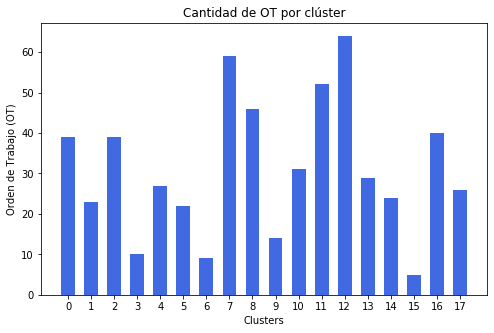

In [107]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=18, width = 0.6, save = save)

### 20. Tópico 19

In [108]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 19] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

279

Número óptimo de clústers: 30


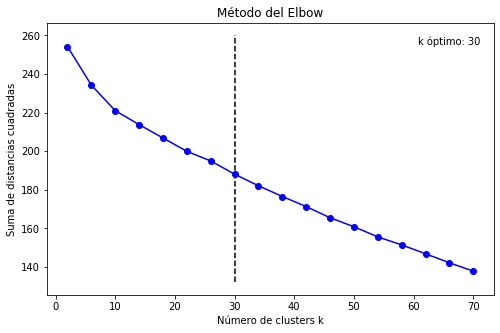

Wall time: 9.01 s


In [109]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=19, save = save)

In [110]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 30
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : cambio de operador fue suspendida por orden de rodrigo diez
	sentence  0 :  se realiza limpiesa de sam dejandolo seco y sin reciduos se realiza limpiesa de sam dejandolo seco y sin reciduos
	sentence  1 :  al llegar se encuentra estacion funciionando sin problemas
	sentence  2 :  cambio de operador fue suspendida por orden de rodrigo diez
Cluster 1 : se cambian 02 filtros en el dispensador n 56 para los productos gas 93 y gas 97 equipo queda operativo se cambian 02 filtros en el dispensador n 56 para los productos gas 93 y gas 97 equipo queda operativo
	sentence  0 :  se realiza el pintado de los spill de las descargas de gas 93 gas 97 pd y kerosene quedando normalizado se realiza el pintado de los spill de las descargas de gas 93 gas 97 pd y kerosene quedando normalizado
	sentence  1 :  se coordinaran trabajos para la proxima semana se realiza la calibracion de los estanques 1 gas 93 2 gas 93 3 gas 97 4 p diesel 5 kerosene y 6 p diesel con el sistema calibex se 

In [111]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : cambio de operador fue suspendida por orden de rodrigo diez
Cluster  1 : se cambian 02 filtros en el dispensador n 56 para los productos gas 93 y gas 97 equipo queda operativo se cambian 02 filtros en el dispensador n 56 para los productos gas 93 y gas 97 equipo queda operativo
Cluster  2 : se realizan pruebas de control mezcla de la gas 95 con numerales mecanicos ambas maquinas se encuentran entregando al 50 la proporcion de mezcla ademas la informacion que figura en las tablas de calibracion del tk de gas 93 coinciden en medadias en la fisica y en el veeder root qdministrador in q que al momento de los cierres de turnos se genera un faltante en numerales pero un sobrante en la cuadratura en dinero litro reciculados gas 93 80 lts gas 95 80 lts gas 97 80 lts se realizan pruebas de control mezcla de la gas 95 con numerales mecanicos ambas maquinas se encuentran entregando al 50 la proporcion de mezcla ademas la informacion que figura en las tablas de calibracion del tk de g

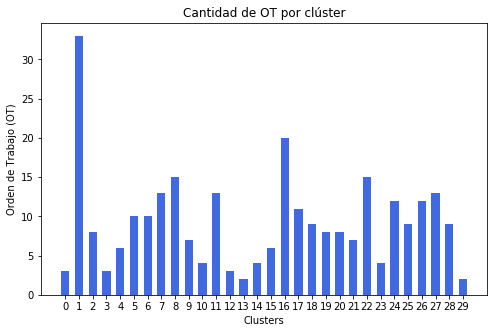

In [112]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=19, width = 0.6, save = save)

### 21. Tópico 20

In [113]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 20] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

345

Número óptimo de clústers: 30


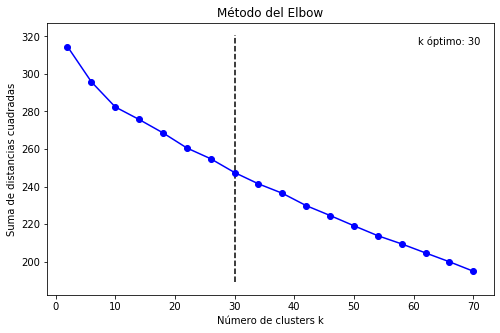

Wall time: 8.99 s


In [114]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=20, save = save)

In [115]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 30
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se realiza mantencion preventiva se calibran 22 de 24 no se calibran 2 bocas de kerosene por no tener producto se realiza mp a 22 bocas de 24 no hay kerosene se hace verificacion volumetrica limpieza de cabezal limpieza de camaras estanque de marmoleria rev de camara surtidor se cambia 2 ampolletas pls 9w p13177 a surtidor 56 y ampolleta e27 a surtidor 3g bodega movil se realiza mantencion preventiva se calibran 22 de 24 no se calibran 2 bocas de kerosene por no tener producto se realiza mp a 22 bocas de 24 no hay kerosene se hace verificacion volumetrica limpieza de cabezal limpieza de camaras estanque de marmoleria rev de camara surtidor se cambia 2 ampolletas pls 9w a surtidor 56 y ampolleta e27 a surtidor 3g
	sentence  0 :  se realiza mantencion preventiva a 35 bocas 9 caras se revisa interior de cabezal y interior camara surtidor se realiza mantencion preventiva a 35 bocas 9 caras se revisa interior de cabezal y interior camara surtidor
	sentence  1 :  se re

In [116]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se realiza mantencion preventiva se calibran 22 de 24 no se calibran 2 bocas de kerosene por no tener producto se realiza mp a 22 bocas de 24 no hay kerosene se hace verificacion volumetrica limpieza de cabezal limpieza de camaras estanque de marmoleria rev de camara surtidor se cambia 2 ampolletas pls 9w p13177 a surtidor 56 y ampolleta e27 a surtidor 3g bodega movil se realiza mantencion preventiva se calibran 22 de 24 no se calibran 2 bocas de kerosene por no tener producto se realiza mp a 22 bocas de 24 no hay kerosene se hace verificacion volumetrica limpieza de cabezal limpieza de camaras estanque de marmoleria rev de camara surtidor se cambia 2 ampolletas pls 9w a surtidor 56 y ampolleta e27 a surtidor 3g
Cluster  1 : se realiza visita a estacion encontrando surtidor 3 y 4 con correa cortada en gas 93 se procede al cambio de 1 correa comprada en la zona quedando surtidor despachando con normalidad se recircula producto en presencia de encargado para pruebas de funci

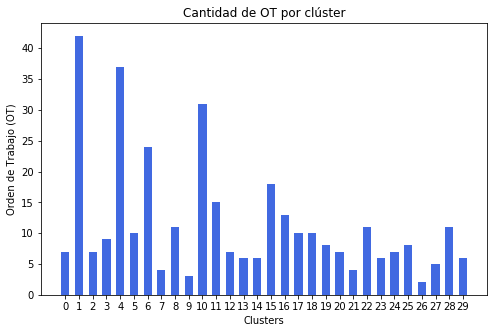

In [117]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=20, width = 0.6, save = save)

### 22. Tópico 21

In [118]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 21] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

1422

Número óptimo de clústers: 14


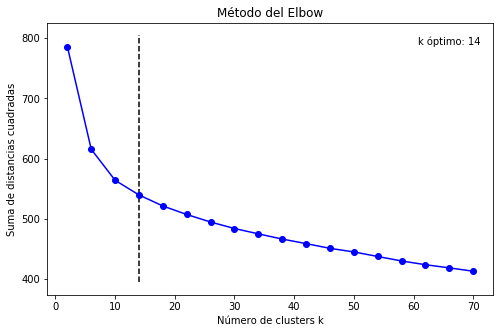

Wall time: 17.9 s


In [119]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=21, save = save)

In [120]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 14
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : ods mal emitida
	sentence  0 :  ods mal emitida
	sentence  1 :  ods mal emitida
	sentence  2 :  ods mal emitida
	sentence  3 :  ods mal emitida
	sentence  4 :  ods mal emitida
	sentence  5 :  ods mal emitida
	sentence  6 :  ods mal emitida
	sentence  7 :  ods mal emitida
	sentence  8 :  ods mal emitida
	sentence  9 :  ods mal emitida
	sentence  10 :  ods mal emitida
	sentence  11 :  ods mal emitida
	sentence  12 :  ods mal emitida
	sentence  13 :  ods mal emitida
	sentence  14 :  ods mal emitida
	sentence  15 :  ods mal emitida
	sentence  16 :  ods mal emitida
	sentence  17 :  ods mal emitida
	sentence  18 :  ods mal emitida
	sentence  19 :  ods mal emitida
	sentence  20 :  ods mal emitida
	sentence  21 :  ods mal emitida
	sentence  22 :  ods mal emitida
	sentence  23 :  ods mal emitida
	sentence  24 :  ods mal emitida
	sentence  25 :  ods mal emitida
	sentence  26 :  ods mal emitida
	sentence  27 :  ods mal emitida
	sentence  28 :  ods mal emitida
	sentence  29 

	sentence  80 :  se realiza el cambio 1 swivel 34 conv 1 filtro spin on y 1 funda negra quedando equipo operativo
	sentence  81 :  se procede al cambio de 3 fundas verdes 12 en bocas 1 10 y 14 ademas se cambia 1 funda negra 1 en boca 3diesel se procede al cambio de 3 fundas verdes 12 en bocas 1 10 y 14 ademas se cambia 1 funda negra 1 en boca 3diesel
	sentence  82 :  queda pendiente el cambio de 01 funda roja en pos 1 boca v power esmreemllazada 01 funda roja p15955 01 mango plastico p 16555 en pos 1 boca v power por estar perforada por uso accesorios en mal estado quedan en eds queda pendiente el cambio de 01 funda roja en pos 1 boca v power esmreemllazada 01 funda roja p15955 01 mango plastico p 16555 en pos 1 boca v power por estar perforada por uso accesorios en mal estado quedan en eds
	sentence  83 :  se realiza el cambio de 11 mangueras las cuales se encontraban deterioradas se reemplazan 2 fundas color rojo se realiza reemplazo de 7 mangueras 34 las cuales se encontraban deteri

	sentence  3 :  se realiza visita a eds para realizar chequeo de pistola en dispensador alto galon lo cual se encuentra con pistola en mal estado por lo tanto se solicita 01 pistola de 1codp14781 con funda negrasolicitado a bodega se realiza cambio de pistola en dispensador 7 de diesel quedando operativo se realiza visita a eds para realizar chequeo de pistola en dispensador alto galon lo cual se encuentra con pistola en mal estado por lo tanto se solicita 01 pistola de 1codp14781 con funda negrasolicitado a bodega se realiza cambio de pistola en dispensador 7 de diesel quedando operativo
	sentence  4 :  se visita eds para realizar chequeo de pistola en 4 de diesel encontrandose en mal estado por lo tanto se solicita o1 pistola de 12 cod p14772 con funda negrasolicitado a bodega se realiza cambio de pistola y funda en dispensador 4 de diesel quedando operativo se visita eds para realizar chequeo de pistola en 4 de diesel encontrandose en mal estado por lo tanto se solicita o1 pistola d

In [121]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : ods mal emitida
Cluster  1 : ot mal asignada por cliente
Cluster  2 : es cambiada 01 funda negra 1 en pos 7 02 fundas negras 34 en pos 5 y 3 diesel 02 fundas rojas en pos 5 y6 08 fundas verdes 3n pos 1 2 3 4 5 productos 93 y 95 todas por estar perforadas en pos 4 es reemplazada p1 breakaweay 34 por estar con filtracion ademas es reemplazado su wipehose 34 por estar en muy mala condicion en pos 3 es reemplazada 01 ampolleta pls 9 watt por estar quemada en display equipo quedan operativos es cambiada 01 funda negra 1 en pos 7 02 fundas negras 34 en pos 5 y 3 diesel 02 fundas rojas en pos 5 y6 08 fundas verdes 3n pos 1 2 3 4 5 productos 93 y 95 todas por estar perforadas en pos 4 es reemplazada p1 breakaweay 34 por estar con filtracion ademas es reemplazado su wipehose 34 por estar en muy mala condicion en pos 3 es reemplazada 01 ampolleta pls 9 watt por estar quemada en display equipo quedan operativos
Cluster  3 : es reemplazado 01 manguera de 34 por 320 01 swivel 34 en pos

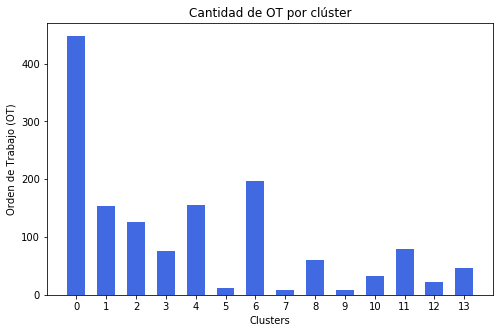

In [122]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=21, width = 0.6, save = save)

### 23. Tópico 22

In [123]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 22] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

1170

Número óptimo de clústers: 22


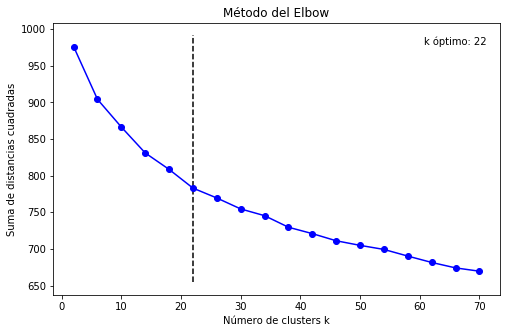

Wall time: 29.2 s


In [124]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=22, save = save)

In [127]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 22
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se cambia 1 pistola 12 y 1 swivel 34 lado 2 93 por filtracion y pistola mal estado quedando dispensador operativo y despachando producto se cambia 1 pistola 12 y 1 swivel 34 lado 2 93 por filtracion y pistola mal estado quedando dispensador operativo y despachando producto
	sentence  0 :  se cambia 1 breakaweay 34 convencional lado 393 se cambia 1 swivel 34 lado 393 mal estado quedando dispensador operativo y despachando producto se cambia 1 breakaweay 34 convencional lado 393 se cambia 1 swivel 34 lado 393 mal estado quedando dispensador operativo y despachando producto
	sentence  1 :  se cambia 1 swivel 34 lado 193 mal estado con filtracion quedando dispensador operativo y despachando producto 93 sin filtracion se cambia 1 swivel 34 lado 193 mal estado con filtracion quedando dispensador operativo y despachando producto 93 sin filtracion
	sentence  2 :  dispensador n 10 presenta defecto en pistola de gasolinas esta se encuentra con sensor en mal estado se reali

	sentence  17 :  se realiza visita a estacion de servicio encontrando funda de pistola de boca 13 producto diesel danada se procede al cambio de esta quedando boca operativa se realiza visita a estacion de servicio encontrando funda de pistola de boca 13 producto diesel danada se procede al cambio de esta quedando boca operativa
	sentence  18 :  se instala destorcedor en pistola gas 93 que se encontraba danado equipo queda operativo se instala destorcedor en pistola gas 93 que se encontraba danado equipo queda operativo
	sentence  19 :  se chequean pistola de 97 encontrandose normales se chequean pistola de 97 encontrandose normales
	sentence  20 :  se cambia pistola 7h de 1 por encontrarse danada quedando normal se cambia pistola 7h de 1 por encontrarse danada quedando normal
	sentence  21 :  se realiza el cambio de 1 pistola vr en dispensador numero 4 de producto gasolina la cual se encontraba danada queda operativa se realiza el cambio de 1 pistola vr en dispensador numero 4 de prod

In [128]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se cambia 1 pistola 12 y 1 swivel 34 lado 2 93 por filtracion y pistola mal estado quedando dispensador operativo y despachando producto se cambia 1 pistola 12 y 1 swivel 34 lado 2 93 por filtracion y pistola mal estado quedando dispensador operativo y despachando producto
Cluster  1 : colgantes cumplen vida util cambio de 1 pistola 34 a boca 2 de pd no corta y filtra cambio de 1 pistola 1 a boca 5 de pd no corta y filtra cambio de 2 dos pistolas autorixadas por encargado de estacion equipo operativo
Cluster  2 : se realiza visita a estacion encontrando dispensador 8 con pistola 1 defectuosa se procede al cambio de 1 pistola 1 quedando boca operativa se realiza visita a estacion encontrando dispensador 8 con pistola 1 defectuosa se procede al cambio de 1 pistola 1 quedando boca operativa
Cluster  3 : se realiza el cambio de 1 manguera rv 1 pistola rv y 1 pistola 12 conv quedando equipo operativo
Cluster  4 : cambio de pistola 34 a boca n 1 de p diesel por estar quebrada ca

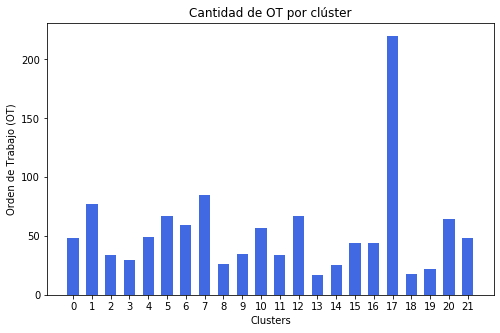

In [129]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=22, width = 0.6, save = save)

### 24. Tópico 23

In [130]:
# Cantidad de OT
df_topic = df[df['Topico Dominante'] == 23] 
sentences = [sent for sent in df_topic['Observación']]
len(sentences)

1398

Número óptimo de clústers: 22


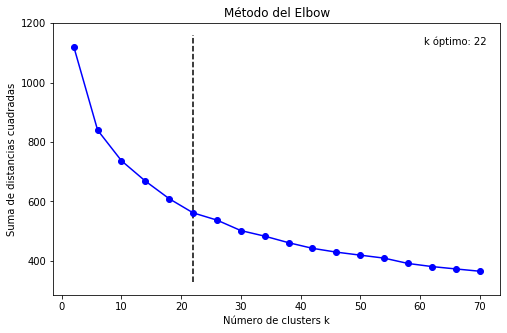

Wall time: 16.1 s


In [131]:
%%time
# Identificando el número óptimo de clústers por medio del método del Elbow
elbow_method(sentences,namecol=namecol, nro_top=23, save = save)

In [132]:
# Ejecutando el algoritmo Kmeans para el número óptimo de clústers 
print('\033[1mCLUSTERS \n\033[0m')
start_time = time()

nclusters= 22
clusters,representativos = cluster_sentences(sentences, nclusters)

for cluster in range(nclusters):
    print (f"\033[1mCluster {cluster} : {sentences[clusters[cluster][representativos[cluster]]]}\033[0m")
    for i,sentence in enumerate(clusters[cluster]):
        print ("\tsentence ",i,": ",sentences[sentence])

elapsed_time = time() - start_time
print("\033[1mElapsed time: %.10f seconds.\033[0m" % elapsed_time)

CLUSTERS 

Cluster 0 : se realiza mantencion preventiva se calibran 12 bocas
	sentence  0 :  mantencion preventiva correspondiente al mes de febrero se raliza mantencion preventiva se calibran 12 bocas
	sentence  1 :  mantencion preventiva del mes de febrero se calibran 12 bocas
	sentence  2 :  se realiza mantencion preventiva a surtidores lados 12 34 56 y 78 se verifica calibracikn con matraz de 20 litros a 12 bocas de 12 se revisan interior de equipos se revisan y prueban accesorios se revisan y limpian spill descargas quedan todos los equipos operativos se realiza mantencion preventiva a surtidores lados 12 34 56 y 78 se verifica calibracikn con matraz de 20 litros a 12 bocas de 12 se revisan interior de equipos se revisan y prueban accesorios se revisan y limpian spill descargas quedan todos los equipos operativos
	sentence  3 :  se realiza mantencion preventiva se calibran 12 bocas
	sentence  4 :  se realiza mantencion preventiva a surtidores lados 12 34 56 y 78 se verifica calibr

	sentence  70 :  se realiza verificacion volumetrica con matraz de 20 litros a lados 12345678910 se revisan y limpian interior de equipos se revisan y limpian spill de descargas se pintan tapas de descargas se cambian 2 filtros de gas93 se cambian 4 ampolletas lado 1 se calibran 34 bocas de 34 se realiza verificacion volumetrica con matraz de 20 litros a lados 123456789 se revisan y limpian interior de equipos se revisan y limpian spill de descargas se pintan tapas de descargas se cambian 2 filtros de gas93 se cambian 4 ampolletas lado 1 se calibran 34 bocas de 34 quedan todos los equipos operativos
	sentence  71 :  se realiza cambio de pistola en mal estado en post 7 pd se prueba equipo quedando operativo producto recirculado devuelto a tk correspondiente se realiza cambio de pistola en mal estado en post 7 pd se prueba equipo quedando operativo producto recirculado devuelto a tk correspondiente
	sentence  72 :  se realiza reemplazo de destorcedor con filtracion en post 5 g95 y post 3

	sentence  22 :  mantencion preventiva se calibran 16 de 17 no se calibra 1 boca de kero por no contar con producto
	sentence  23 :  mantencion preventiva se calibran 22 de 26 no se calibran 2 bocas de diesel por encontrarse desabilitada y 2 bocas de kero por no contar con producto
	sentence  24 :  mantencion preventiva se calibran 34 de 36 no se calibran 2 bocas de kero por no contar con producto
	sentence  25 :  mantencion preventiva se calibran 40 de 41 no se calibra 1 boca de kero por no contar con producto
	sentence  26 :  mantencion preventiva se calibran 16 de 18 no se calibran 2 bocas de kero por no contar con producto
	sentence  27 :  mantencion preventiva se calibran 24 de 26 no se calibran 2 bocas de kero por no contar con producto
	sentence  28 :  mantencion preventiva se calibran 32 de 34 no se calibran 2 bocas de kero por no contar con producto
	sentence  29 :  mantencion preventiva se calibran 28 de 30 no se calibran 2 bocas de kero por no contar con producto
	sentence  

In [133]:
# Clusters representativos
for cluster in range(nclusters):
    print ("\033[1mCluster ",cluster,":\033[0m",sentences[clusters[cluster][representativos[cluster]]])

Cluster  0 : se realiza mantencion preventiva se calibran 12 bocas
Cluster  1 : mantencion preventiva se calibran 17 de 18 no se calibra 1 boca de kero por encontrase fuera de servicio queda pendiente realizar mantenimiento preventivo ya que estacion de servicio se encuentra con problemas de orpak se realiza mantenimiento preventivo se calibran 16 bocas en total no se calibran 2 bocas de equipo kerosene fuera de servicio se revisan y limpian equipos se cambia 1 adhesivo boca tk en mal estado producto recirculado devuelto a tk correspondiente equipos quedan operativos se chequea tdf y tks eds queda totalmente operativa mantencion preventiva se calibran 17 de 18 no se calibra 1 boca de kero por encontrase fuera de servicio queda pendiente realizar mantenimiento preventivo ya que estacion de servicio se encuentra con problemas de orpak se realiza mantenimiento preventivo se calibran 16 bocas en total no se calibran 2 bocas de equipo kerosene fuera de servicio se revisan y limpian equipos 

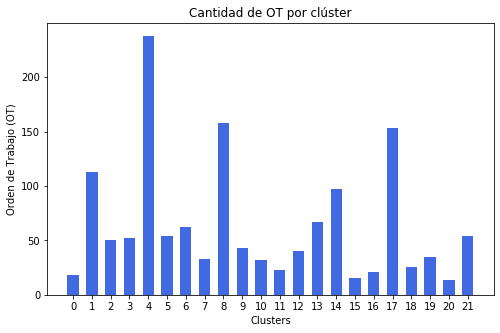

In [134]:
# Plot - Cantidad de sentences por cluster
len_clusters(dic=clusters,n = nclusters, namecol = namecol , nro_top=23, width = 0.6, save = save)